In [11]:
import numpy as np
from matplotlib import pyplot as plt

import h5py
import numpy as np

# Include parent directory in sys.path to import local modules
import glob
import os
import sys
nb_dir = os.path.split(os.getcwd())[0]
if nb_dir not in sys.path:
    sys.path.append(nb_dir)



### Writing to HDF5 files ###
def _save_dict_to_h5(group, data_dict):
    for key, value in data_dict.items():
        if isinstance(value, dict):
            # If it's a dictionary, create a new group
            new_group = group.create_group(key)
            _save_dict_to_h5(new_group, value) # Recursively call for nested dict
        else:
            # # Check if numpy array or standard python type
            # if not isinstance(value, np.ndarray) or not isinstance(value, (int, float, str, bool)):
            #     raise ValueError(f"Value for key '{key}' is not a numpy array.")
            # if value.ndim > 2:
            #     raise ValueError(f"Value for key '{key}' has more than 2 dimensions, which is not supported.")
            # If it's an array, create a dataset
            group.create_dataset(key, data=value)


def save_to_hdf5(my_data, filename):
    """
    Save a dictionary of numpy arrays to an HDF5 file.

    Parameters:
    my_data (dict): Dictionary where keys are dataset names and values are numpy arrays.
    file_name (str): Name of the output HDF5 file.
    """
    # 1. Open a new HDF5 file
    # 2. Create datasets for each array in the dictionary
    with h5py.File(filename, 'w') as f:
        _save_dict_to_h5(f, my_data)


### Reading from HDF5 files ###

def _load_dict_from_h5(group):
    data_dict = {}
    for key in group.keys():
        item = group[key]
        if isinstance(item, h5py.Group):
            # If it's a group, recursively load it
            data_dict[key] = _load_dict_from_h5(item)
        else:
            # Otherwise, it's a dataset
            data = item[()]
            if isinstance(data, bytes):
                # Decode bytes to string if necessary
                data_dict[key] = data.decode("utf-8")
            else:
                data_dict[key] = data
    return data_dict


def load_from_hdf5(filename):
    """
    Recursively load a nested dictionary of numpy arrays from an HDF5 file.

    Parameters:
    filename (str): Name of the HDF5 file to read.
    Returns:
    dict: A dictionary where keys are dataset names and values are numpy arrays.
    """

    with h5py.File(filename, 'r') as f:

        return _load_dict_from_h5(f)
    

def load_key_from_hdf5(filename, key):
    """
    Load a specific key from an HDF5 file.

    Parameters:
    filename (str): Name of the HDF5 file to read.
    key (str): The key to load from the file.

    Returns:
    The data associated with the specified key.
    """
    with h5py.File(filename, 'r') as f:
        if key in f:
            if isinstance(f[key], h5py.Group):
                # If it's a group, recursively load it
                return _load_dict_from_h5(f[key])
            else:
                return f[key][()]
        else:
            raise KeyError(f"Key '{key}' not found in the file '{filename}'.")    


def get_colors(n):
    cmap = plt.get_cmap('tab20')#('jet') #('viridis')
    return [cmap(i / (n - 1)) for i in range(n)]           

## Setting the filename

In [12]:
saving_plots = True

folder_path = "/Users/arash/Downloads/plotting adams data/data_20251001/"
data_path = "/Users/arash/Downloads/plotting adams data/data_20251001/fin_data/"
# folder_path = "/Users/arash/Julia Projects/Quantum_Trajectory_Adam/QuantumChannelTrajectories.jl/data/"

fermions = False # Whether to use fermionic statistics
dt = 0.02
p = 2*dt#0.5
Nx = 4
Ny = 4
N = Nx*Ny
V = 0.0
b = 0.5 #2/((Nx-1)*(Ny-1))  # Magnetic field strength
num_iterations = 3000
steps = 2000
initialization = False

site_in = 1  # Site where the current is injected
drive_type = "current"  # :current, :dephasing
initial_state = "random"  # :checkerboard, :empty, :filled, :random, :custom
B = b*np.pi # Magnetic field in units of flux quantum
site_out = N  # Site where the current is extracted
even_parity = False  # Whether to use even parity
pinned_corners = True  # Whether to pin the corners of the lattice
single_shot = False  # Whether to perform single shot measurements

trotter_evo = False
cir_typ = "Adam" #"Anna"

suffix = "_Adam" if not fermions else ""

if fermions:
    # filename = "fermions_"
    particle_name = "fermions"
else:
    # filename = "bosons_"
    particle_name = "bosons"

filename = f"{Nx}x{Ny}_dt{dt}_p{p}_b{b}_V{V}_steps{steps}_trajectories{num_iterations}_{drive_type}_{initial_state}"
if initialization:
    filename += "_custom"
if even_parity:
    filename += "_even_parity"
if pinned_corners:
    filename += "_pinned_corners"
if single_shot:
    filename += "_single_shot"
if trotter_evo:
    filename += "_trotter"
    if not fermions:
        filename += "_"+cir_typ

# filename += "_run1"

params = load_key_from_hdf5(data_path+f"{particle_name}_"+f"{filename}.h5", "params")
print(params['bonds'])


sbfldr1 = f"QC" if trotter_evo else "HM"
newpath = folder_path +'plots/'+sbfldr1+'/'+particle_name+'/'#+f'{dt}/'

if not os.path.exists(newpath) and saving_plots:
    print("file created")
    os.makedirs(newpath)



[( 2,  3) ( 3,  4) ( 5,  6) ( 6,  7) ( 7,  8) ( 9, 10) (10, 11) (11, 12)
 (13, 14) (14, 15) ( 2,  6) ( 3,  7) ( 4,  8) ( 5,  9) ( 6, 10) ( 7, 11)
 ( 8, 12) ( 9, 13) (10, 14) (11, 15)]
file created


---
# Plotting Density Trace

[0.8315496633518568, 0.5800875134198354, 0.5224418915801893, 0.4997848558106475, 0.5801659532852702, 0.5388614424691314, 0.5000293030143044, 0.4777246361296683, 0.5224248767167681, 0.5001039400054691, 0.4624043751826007, 0.42117694906043424, 0.4998610768229835, 0.4777567276899049, 0.42155912649055405, 0.16306766897038244]


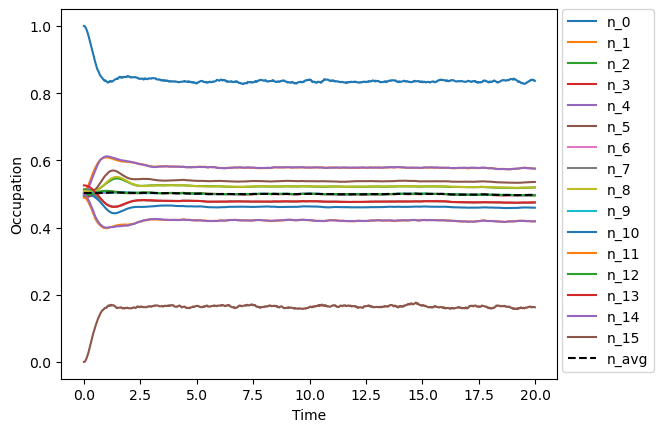

In [13]:
n_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "n_avg")
params = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "params")
t_list = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "t_list")

# Extract parameters
Nx = params['Nx']
Ny = params['Ny']
N = Nx * Ny

limm=1000

for i in range(N):
    plt.plot(t_list[:limm], n_avg[i,:limm], label=f"n_{i}")
plt.plot(t_list[:limm], np.sum(n_avg[:,:limm], axis=0)/(N), '--', c='k', label="n_avg")
plt.xlabel("Time")
plt.ylabel("Occupation")
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left',
           borderaxespad=0.)

if saving_plots:
    plt.savefig(newpath + "density_" + filename + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)
    print( list(n_avg[:,-1]))

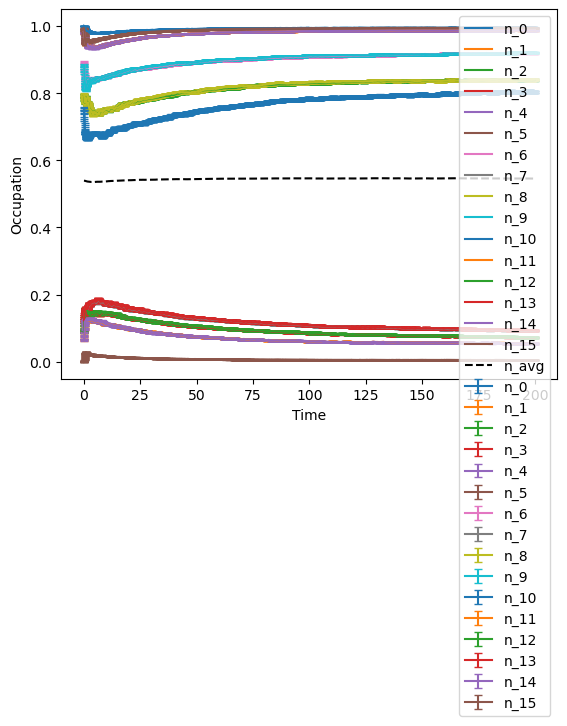

In [357]:

n_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "n_avg")
n_sq_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "n_sq_avg")
params = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "params")
t_list = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "t_list")

# Extract parameters
Nx = params['Nx']
Ny = params['Ny']
N = Nx * Ny

sem = np.sqrt(n_sq_avg - n_avg**2)/np.sqrt(num_iterations)

for i in range(N):
    plt.errorbar(t_list, n_avg[i,:], yerr=sem[i,:], label=f"n_{i}", capsize=3, color=f"C{i}")
    plt.fill_between(t_list, n_avg[i,:] - sem[i,:], n_avg[i,:] + sem[i,:], alpha=0.2, color=f"C{i}")
    plt.plot(t_list, n_avg[i,:], label=f"n_{i}", color=f"C{i}")
    

plt.plot(t_list, np.sum(n_avg, axis=0)/N, '--', c='k', label="n_avg")
plt.xlabel("Time")
plt.ylabel("Occupation")
plt.legend();

# plt.savefig(newpath + "density_" + filename + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)
# plt.savefig(f"../figures/fermion_density_4x4_dt{dt}_p{p}_b{b}_V{V}_tajectories{num_iterations}.png", bbox_inches='tight', pad_inches=0.1, dpi=300)

## Log-plot of densities

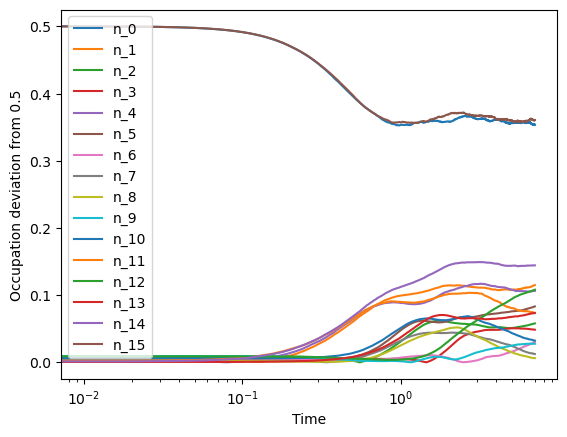

In [ ]:
n_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "n_avg")
params = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "params")
t_list = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "t_list")

# Extract parameters
Nx = params['Nx']
Ny = params['Ny']
N = Nx * Ny

for i in range(N):
    plt.plot(t_list, np.abs(n_avg[i,:]-0.5), label=f"n_{i}")
plt.xlabel("Time")
plt.ylabel("Occupation deviation from 0.5")
plt.legend()
plt.xscale("log")

if saving_plots:
    plt.savefig(newpath+"logDensity_" + filename + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)


---
# Current trace

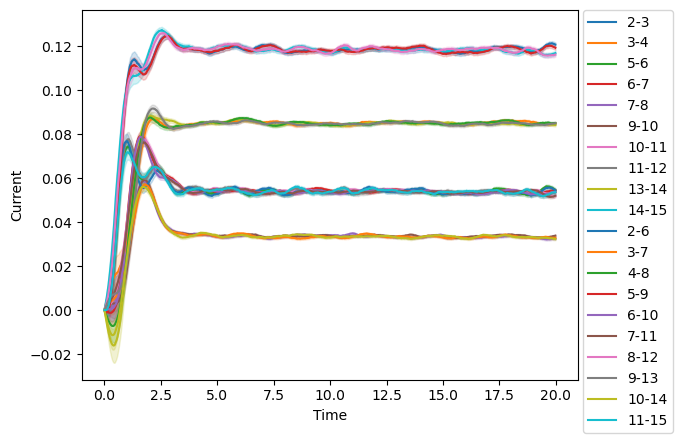

In [14]:
avg_currents = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "avg_currents")
currents_sq_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "currents_sq_avg")
params = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "params")
t_list = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "t_list")

# Extract parameters
Nx = params['Nx']
Ny = params['Ny']
N = Nx * Ny
bonds = params['bonds']

sem_currents = np.sqrt(currents_sq_avg - avg_currents**2)/np.sqrt(num_iterations)

for i, bond in enumerate(bonds):
    plt.fill_between(t_list[:limm], avg_currents[i,:limm] - sem_currents[i,:limm], avg_currents[i,:limm] + sem_currents[i,:limm], alpha=0.2, color=f"C{i}")
    plt.plot(t_list[:limm], avg_currents[i,:limm], label=f"{bond[0]}-{bond[1]}", color=f"C{i}")
plt.xlabel("Time")
plt.ylabel("Current")
plt.legend(bbox_to_anchor=(1.01, 1), loc='upper left',
           borderaxespad=0.)

if saving_plots:
    plt.savefig(newpath + "current_" + filename + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)


## Fermionic interacting current visibility
 

V=0.0
[ 0.00260995 -0.00760728 -0.00157653 -0.00719712]
V=0.5
[0.02052693 0.24202434 0.25115056 0.10390172]
V=1.0
[0.15080451 0.29611786 0.29048613 0.10918078]
V=1.25
[0.2578878  0.35239568 0.34300313 0.1522876 ]
V=1.5
[0.31501052 0.35863732 0.35666567 0.16290141]
V=2.0
[0.30083368 0.20983358 0.22727942 0.07667992]


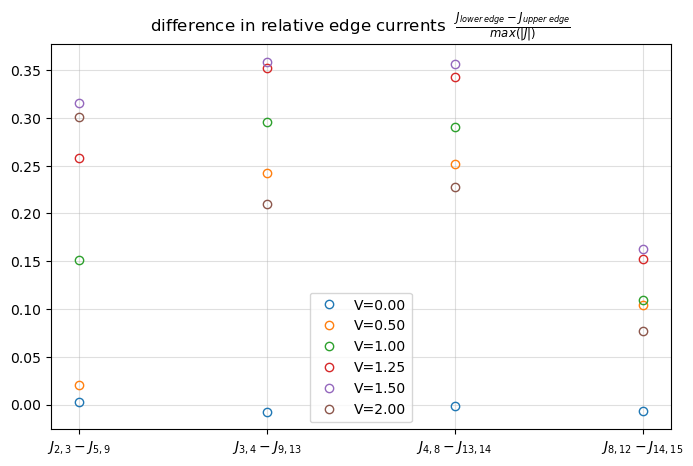

In [96]:

upper_indxs = [0, 1, 12,16]#[0,10,1,113,]
lower_indxs = [13,17,8, 9]#[13,2,17,5,14]
V_list = [0.0, 0.5, 1.0, 1.25, 1.5, 2.0]

file_list=[
    f"fermions_4x4_dt0.02_p0.04_b0.5_V0.0_steps2000_trajectories9996_current_random_pinned_corners.h5",
    f"fermions_4x4_dt0.02_p0.04_b0.5_V0.5_steps1000_trajectories10000_current_random_pinned_corners.h5",
    f"fermions_4x4_dt0.02_p0.04_b0.5_V1.0_steps1000_trajectories10000_current_random_pinned_corners.h5",
    f"fermions_4x4_dt0.02_p0.04_b0.5_V1.25_steps1000_trajectories10000_current_random_pinned_corners.h5",
    f"fermions_4x4_dt0.02_p0.04_b0.5_V1.5_steps1000_trajectories10000_current_random_pinned_corners.h5",
    f"fermions_4x4_dt0.02_p0.04_b0.5_V2.0_steps1000_trajectories9966_current_random_pinned_corners.h5"
]

fig, ax = plt.subplots(1,1, figsize=(8,5))

params = load_key_from_hdf5(data_path+file_list[0], "params")
bonds = params['bonds']
# bonds = [rf"$J_{{ {i}->{f} }}$" for i,f in params['bonds']]
str_bonds = [rf"$J_{{ {bonds[upper_indxs[n]][0]},{bonds[upper_indxs[n]][1]} }} - J_{{ {bonds[lower_indxs[n]][0]},{bonds[lower_indxs[n]][1]} }}$" for n in range(4)]
Nx = params['Nx']
Ny = params['Ny']
N = Nx * Ny


for v, Vs in enumerate(V_list):

    avg_current = load_key_from_hdf5(data_path+file_list[v], "avg_currents")
    currents_sq_avg = load_key_from_hdf5(data_path+file_list[v], "currents_sq_avg")
    # params = load_key_from_hdf5(data_path+file_list[v], "params")
    # t_list = load_key_from_hdf5(data_path+file_list[v], "t_list")
    # bonds = [f"{i}->{f}" for i,f in params['bonds']]

    # Extract parameters
    # print(avg_current.shape)
    print(f"V={Vs}")
    # print(bonds[[0,1,12,16]])
    # print(bonds[[13,17,8,9]])
    # print(sum(avg_current[[0,1,12,16],-1])/4 - sum(avg_current[[13,17,8,9],-1])/4)
    data = (avg_current[upper_indxs,-1] - avg_current[lower_indxs,-1] )/np.max(np.abs(avg_current[:,-1]))
    print(data)
    ax.plot(np.arange(4, dtype=np.int8), data, ls='', marker='o', markerfacecolor='none', label=f'V={Vs:.2f}')
    # print("xxx")

ax.legend()    

ax.set_xticks(range(4), str_bonds, rotation='horizontal')
# ax[0].set_ylabel("final currents")
ax.set_title(r"difference in relative edge currents  $\frac{J_{lower\;edge} - J_{upper\; edge} }{max(|J|)}$")
ax.grid(alpha=0.4)


if saving_plots:
    this_filename = f"{particle_name}_{Nx}x{Ny}_dt{dt}_p{p}_b{b}_NESS_trajectories10000_{drive_type}_{initial_state}"

    fig.savefig(newpath + "edge_chirality_" + this_filename + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)



---
# NESS Snapshot

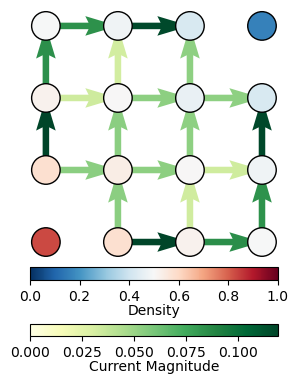

In [15]:
n_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "n_avg").T
avg_currents = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "avg_currents").T
params = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "params")
t_list = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "t_list")

# Extract parameters
Nx = params['Nx']
Ny = params['Ny']
N = Nx * Ny
bonds = params['bonds']

time_step = -1


plotting_threshold = 0.0  # Threshold for plotting currents
marker_size = 750 * (3/Nx)**2  # Size of the markers for the density plot
arrow_width = 0.035 * 3/Nx  # Width of the arrows in the quiver plot

# single line definition of empty lists for X, Y, U, V, C
X = []; Y = []; U1 = []; U2 = []; C = []
for i, bond in enumerate(bonds):
    # convert back from n to x,y coordinates
    x1, y1 = (bond[0]-1) % Nx, (bond[0]-1) // Nx
    x2, y2 = (bond[1]-1) % Nx, (bond[1]-1) // Nx

    if np.abs(avg_currents[time_step,i]) > plotting_threshold*np.abs(avg_currents[time_step,:]).max():
        C.append(np.abs(avg_currents[time_step,i]))

        if np.real(avg_currents[time_step,i]) > 0:
            X.append(x1)
            Y.append(y1)
            U1.append(x2-x1)
            U2.append(y2-y1)
        else:
            X.append(x2)
            Y.append(y2)
            U1.append(x1-x2)
            U2.append(y1-y2)

fig, ax = plt.subplots()

p1 = ax.quiver(X, Y, U1, U2, C, cmap="YlGn", angles='xy', scale_units='xy', scale=1, width=arrow_width)
p1.set_clim(0, np.max(C))
cb1 = plt.colorbar(p1, ax=ax, orientation='horizontal', shrink=0.5, pad=0.03)
cb1.set_label('Current Magnitude', labelpad=0)

X = []; Y = []; C = []
for x in range(Nx):
    for y in range(Ny):
        n = x % Nx + y*Nx
        X.append(x)
        Y.append(y)
        C.append(n_avg[time_step,n])

p2 = ax.scatter(X, Y, c=C, cmap="RdBu_r", s=marker_size, edgecolors= "black", vmin=0, vmax=1)
cb2 = plt.colorbar(p2, ax=ax, orientation='horizontal', shrink=0.5, pad=0.03)
cb2.set_label('Density', labelpad=0)

# Add automatic padding to prevent cutoff
ax.margins(0.1 * 3/Nx)  # Add padding around the data
# Alternatively, you could use: ax.set_xlim(-0.5, Nx-0.5); ax.set_ylim(-0.5, Ny-0.5)

ax.set_axis_off()
ax.set_aspect('equal')

if saving_plots:
    plt.savefig(newpath + "NESS_" + filename + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)


## Time-Averaged Snapshot

FileNotFoundError: [Errno 2] No such file or directory: '/Users/arash/Downloads/plotting adams data/data_20250912/plots/QC/bosons/0.15/AVG_NESS_4x4_dt0.15_p0.3_b0.0_V4.0_steps15_trajectories5000_current_random_NESS_pinned_corners_trotter_Adam.png'

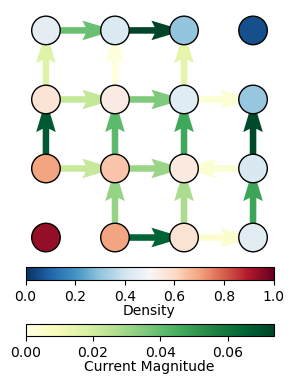

In [ ]:
n_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "n_avg").T
avg_currents = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "avg_currents").T
params = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "params")
t_list = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "t_list")

# Extract parameters
Nx = params['Nx']
Ny = params['Ny']
N = Nx * Ny
bonds = params['bonds']

plotting_threshold = 0.0  # Threshold for plotting currents
marker_size = 750 * (3/Nx)**2  # Size of the markers for the density plot
arrow_width = 0.035 * 3/Nx  # Width of the arrows in the quiver plot


time_averaged_currents = np.mean(avg_currents[7*steps//8:-1], axis=0)
time_averaged_n = np.mean(n_avg[7*steps//8:-1], axis=0)

# single line definition of empty lists for X, Y, U, V, C
X = []; Y = []; U = []; V = []; C = []
for i, bond in enumerate(bonds):
    # convert back from n to x,y coordinates
    x1, y1 = (bond[0]-1) % Nx, (bond[0]-1) // Nx
    x2, y2 = (bond[1]-1) % Nx, (bond[1]-1) // Nx

    if np.abs(time_averaged_currents[i]) > plotting_threshold*np.abs(time_averaged_currents).max():
        C.append(np.abs(time_averaged_currents[i]))

        if np.real(time_averaged_currents[i]) > 0:
            X.append(x1)
            Y.append(y1)
            U.append(x2-x1)
            V.append(y2-y1)
        else:
            X.append(x2)
            Y.append(y2)
            U.append(x1-x2)
            V.append(y1-y2)

fig,ax = plt.subplots()

p1 = ax.quiver(X, Y, U, V, C, cmap="YlGn", angles='xy', scale_units='xy', scale=1, width=arrow_width)
p1.set_clim(0, np.max(C))
cb1 = plt.colorbar(p1, ax=ax, orientation='horizontal', shrink=0.5, pad=0.03)
cb1.set_label('Current Magnitude', labelpad=0)

X = []; Y = []; C = []
for x in range(Nx):
    for y in range(Ny):
        n = x % Nx + y*Nx
        X.append(x)
        Y.append(y)
        C.append(time_averaged_n[n])


p2 = ax.scatter(X, Y, c=C, cmap="RdBu_r", s=marker_size, edgecolors= "black", vmin=0, vmax=1)
cb2 = plt.colorbar(p2, ax=ax, orientation='horizontal', shrink=0.5, pad=0.03)
cb2.set_label('Density', labelpad=0)

# Add automatic padding to prevent cutoff
ax.margins(0.1)  # Add padding around the data
# Alternatively, you could use: ax.set_xlim(-0.5, Nx-0.5); ax.set_ylim(-0.5, Ny-0.5)

ax.set_axis_off()
ax.set_aspect('equal')
# plt.show()
plt.savefig(newpath + "AVG_NESS_" + filename + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)


## NESS density pattern

[0.791064786982824, 0.5202296157631452, 0.519729004395596, 0.5017112787191996, 0.5200942936020907, 0.5297794699262162, 0.5035866537147837, 0.48182123312731734, 0.5197660140868686, 0.5023769614126224, 0.4713011735065523, 0.4802662076555327, 0.5006084270110721, 0.4835655091908213, 0.47966304578331165, 0.21671006025609213]


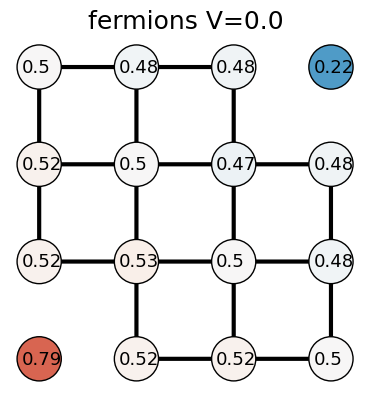

In [111]:
time_step = -1

plotting_threshold = 0.0  # Threshold for plotting currents
marker_size = 1800 * (3/Nx)**2  # Size of the markers for the density plot
arrow_width = 0.015 * 3/Nx  # Width of the arrows in the quiver plot

# single line definition of empty lists for X, Y, U, V, C
X = []; Y = []; U1 = []; U2 = []; C = []
for i, bond in enumerate(bonds):
    # convert back from n to x,y coordinates
    x1, y1 = (bond[0]-1) % Nx, (bond[0]-1) // Nx
    x2, y2 = (bond[1]-1) % Nx, (bond[1]-1) // Nx

    if np.abs(avg_currents[time_step,i]) > plotting_threshold*np.abs(avg_currents[time_step,:]).max():
        # C.append(np.abs(avg_currents[time_step,i]))
        C.append(1.0)

        if np.real(avg_currents[time_step,i]) > 0:
            X.append(x1)
            Y.append(y1)
            U1.append(x2-x1)
            U2.append(y2-y1)
        else:
            X.append(x2)
            Y.append(y2)
            U1.append(x1-x2)
            U2.append(y1-y2)

fig, ax = plt.subplots()

p1 = ax.quiver(X, Y, U1, U2, C, cmap="binary_r", angles='xy', scale_units='xy', scale=1.0, width=arrow_width, headwidth=0.00)

X = []; Y = []; C = []
for x in range(Nx):
    for y in range(Ny):
        n = x % Nx + y*Nx
        X.append(x)
        Y.append(y)
        C.append(n_avg[time_step,n])
        ax.annotate(
            np.round(n_avg[time_step,n],decimals=2), 
            (x-0.18,y-0.05), fontsize=13)

p2 = ax.scatter(X, Y, c=C, cmap="RdBu_r", s=marker_size, edgecolors= "black", vmin=0, vmax=1)

ax.annotate(particle_name+f" V={V}", (0.5, 3.4), fontsize=18)

# Add padding around the data
ax.set_xlim(-0.3, Nx-0.5); 
ax.set_ylim(-0.3, Ny-0.5)


ax.set_axis_off()
ax.set_aspect('equal')

# plt.savefig(newpath + "_NESS_density_pattern_" + filename + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)

print(list(n_avg[time_step,:]))

---
# Density Correlation matrix

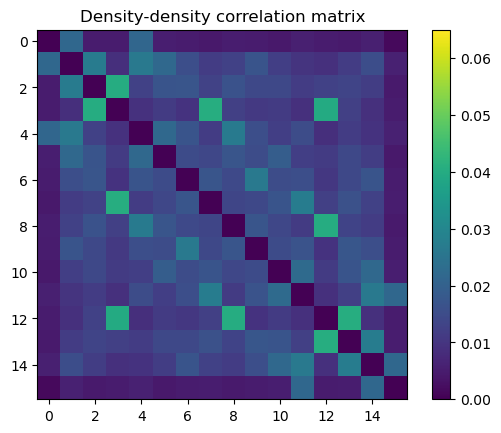

In [ ]:
avg_dd_correlations = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "avg_dd_correlations")

plt.imshow(np.abs(avg_dd_correlations -np.diag(np.diag(avg_dd_correlations))), cmap="viridis", vmin=0)
plt.colorbar()
plt.title("Density-density correlation matrix")
plt.clim([0,0.065])

# plt.show()
if saving_plots:
    plt.savefig(newpath + "correlation_" + filename + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)

# plt.savefig(f"../figures/fermion_correlations_4x4_dt{dt}_p{p}_b{b}_V{V}_tajectories{num_iterations}.pdf", bbox_inches='tight', pad_inches=0.1, dpi=300)


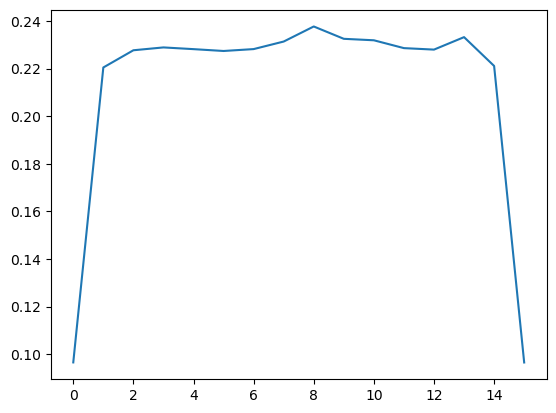

In [50]:
plt.plot(np.diag(avg_dd_correlations))

---
# Equilibrium condition

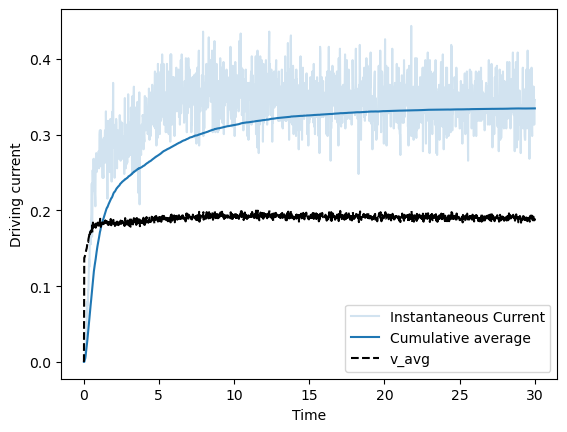

In [39]:
K_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "K_avg")
spead_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "speed_avg")

limm =1500
driving_current = (K_avg[1,:limm] + K_avg[4,:limm] + K_avg[6,:limm] + K_avg[8,:limm] + 2*K_avg[7,:limm]) / 2

plt.plot(t_list[1:limm+1], driving_current[:limm]/dt, alpha=0.2, c="C0", label="Instantaneous Current")
plt.plot(t_list[1:limm+1], np.cumsum(driving_current[:limm])/t_list[1:limm+1], c="C0", label="Cumulative average")

plt.plot(t_list[1:limm+1], spead_avg[:limm]/(5*np.max(spead_avg)), '--', c='k', label="v_avg")

plt.xlabel("Time")
plt.ylabel("Driving current")
plt.legend()

# plt.show()

if saving_plots:
    plt.savefig(newpath + "kraus_" + filename + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)
# plt.savefig(f"../figures/boson_kraus_4x4_dt{dt}_p{p}_b{b}_V{V}_tajectories{num_iterations}.png", bbox_inches='tight', pad_inches=0.1, dpi=300)

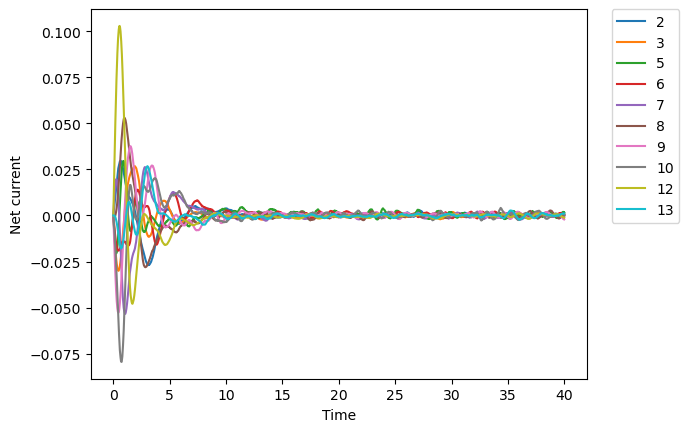

In [36]:
avg_currents = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "avg_currents").T
params = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "params")
t_list = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "t_list")

# Extract parameters
Nx = params['Nx']
Ny = params['Ny']
N = Nx * Ny
bonds = params['bonds']

currents_sq_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "currents_sq_avg").T
sem_currents = np.sqrt(4)*np.mean(np.sqrt(currents_sq_avg - avg_currents**2)/np.sqrt(num_iterations), axis=1)



net_currents = np.zeros((len(t_list),N))
for site in range(N):

    if site in [0, 1, Nx, N-2, N-Nx-1, N-1]:
        continue

    for ii, bond in enumerate(bonds):

        if bond[0] == site + 1:
            net_currents[:,site] -= avg_currents[:,ii]
        elif bond[1] == site + 1:
            net_currents[:,site] += avg_currents[:,ii]

for site in range(N):
    if site in [0, 1, Nx, N-2, N-Nx-1, N-1]:
        continue
    plt.plot(t_list, net_currents[:,site], label=f"{site}")

# plt.plot(t_list, sem_currents, "--", alpha=0.5, c="k", label="Current standard error")
# plt.plot(t_list, -sem_currents, "--", alpha=0.5, c="k")

plt.xlabel("Time")
plt.ylabel("Net current")
# Legend on right outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left',
           borderaxespad=0.)


if saving_plots and False:
    plt.savefig(newpath + "NetCurrent_" + filename + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)
# plt.savefig(f"../figures/boson_net_current_4x4_dt{dt}_p{p}_b{b}_V{V}_tajectories{num_iterations}.png", bbox_inches='tight', pad_inches=0.1, dpi=300)

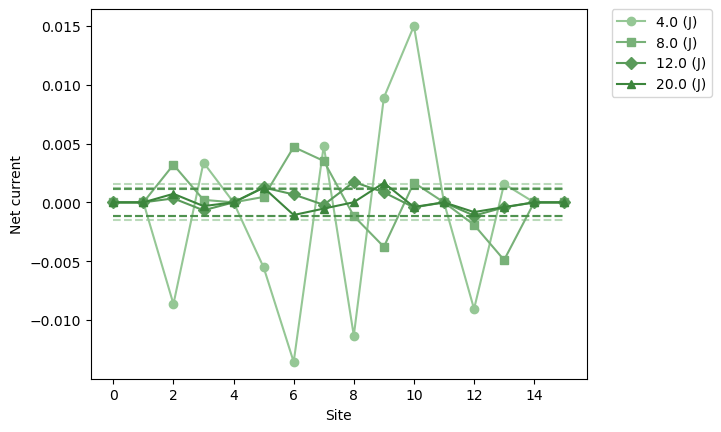

In [38]:
c1 = np.array([31/256, 119/256, 180/256]) * 0.7
c1_light = np.array([150/256, 200/256, 256/256])

c2 = np.array([255/256, 127/256, 14/256]) * 0.7
c2_light = np.array([255/256, 200/256, 150/256])

c3 = np.array([44/256, 160/256, 44/256]) * 0.7
c3_light = np.array([150/256, 200/256, 150/256])

marker_list = ['o', 's', 'D', '^']

# for ii, num_steps in enumerate([400,500,600,700]):
for ii, num_steps in enumerate([200,400,600,1000]):

    # interpolate the colour from c1_light to c1
    col = c3_light * (1 - ii/4) + c3 * (ii/4)

    plt.plot([0,N-1], [sem_currents[num_steps], sem_currents[num_steps]], "--", alpha=0.65, c=col)
    plt.plot([0,N-1], [-sem_currents[num_steps], -sem_currents[num_steps]], "--", alpha=0.65, c=col)
    plt.plot(np.arange(N), net_currents[num_steps,:], marker=marker_list[ii],  c=col, label=f"{num_steps*dt} (J)")

plt.xlabel("Site")
plt.ylabel("Net current")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left',
           borderaxespad=0.)


if saving_plots:
    plt.savefig(newpath + "equilibrium_" + filename + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)

# plt.savefig(f"../figures/boson_equilibrium_4x4_dt{dt}_p{p}_b{b}_V{V}_tajectories{num_iterations}.png", bbox_inches='tight', pad_inches=0.1, dpi=300)

In [ ]:

filenames = ["bosons_4x4_dt0.25_p0.5_b0.0_V0.0_steps40_trajectories2000_current_random_pinned_corners",
             "bosons_4x4_dt0.25_p0.5_b0.0_V2.0_steps40_trajectories2000_current_random_pinned_corners",
             "bosons_4x4_dt0.25_p0.5_b0.0_V4.0_steps40_trajectories2000_current_random_pinned_corners"]

for ii, filename in enumerate(filenames):

    K_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "K_avg")

    driving_current = (K_avg[1,:] + K_avg[4,:] + K_avg[6,:] + K_avg[8,:] + 2*K_avg[7,:]) / 2

    plt.plot(t_list[1:], driving_current/dt, alpha=0.2, c=f"C{ii}")#, label=f"Inst. V={2*ii}")

    plt.plot(t_list[1:], np.cumsum(driving_current)/t_list[1:], c=f"C{ii}", label=f"V={2*ii}")

plt.xlabel("Time")
plt.ylabel("Driving current")
plt.legend()

# if saving_plots:
    # plt.savefig(newpath + "density_" + filename + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)


---
# Speed Story

[0.         3.39297703 3.43700802 ... 1.27407763 1.26424121 1.27280992]


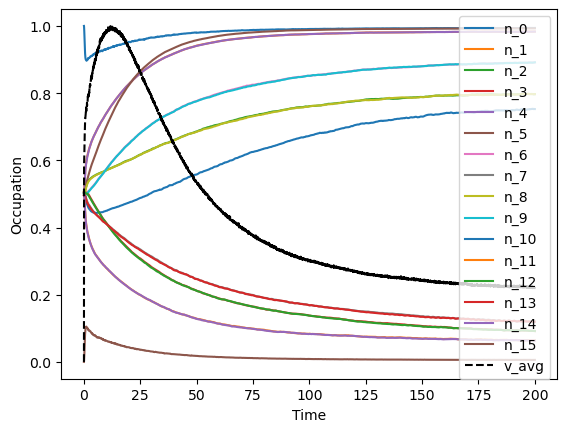

In [136]:
n_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "n_avg")
spead_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "speed_avg")
params = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "params")
t_list = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "t_list")

# Extract parameters
Nx = params['Nx']
Ny = params['Ny']
N = Nx * Ny


for i in range(N):
    plt.plot(t_list, n_avg[i,:], label=f"n_{i}")
# plt.plot(t_list, np.sum(n_avg, axis=0)/(num_iterations*N), '--', c='k', label="n_avg")
plt.plot(t_list, spead_avg/(np.max(spead_avg)), '--', c='k', label="v_avg")
# plt.plot(t_list, dt* spead_avg[1]/(num_iterations), ':', c='k', label="E_avg")

plt.xlabel("Time")
plt.ylabel("Occupation")
plt.legend()

print(spead_avg/dt)

if saving_plots and True:
    plt.savefig(newpath + "relaxpeed_" + filename + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)

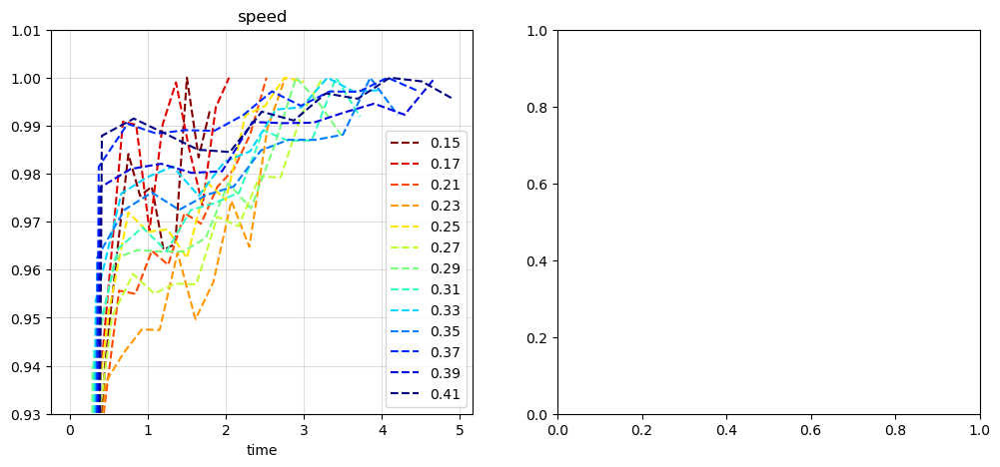

In [ ]:
tr_steps=12
dt_list = [0.15, 0.17, 0.21, 0.23, 0.25, 0.27, 0.29, 0.31, 0.33, 0.35, 0.37, 0.39, 0.41 ]
# tr_steps=20 # dt_list = [0.15, 0.17, 0.20, 0.21, 0.23, 0.25, 0.26, 0.28, 0.30, 0.32, 0.34]

colors = get_colors(len(dt_list))
fig, ax = plt.subplots(1,2, figsize=(12,5))
# ax[0].plot(t_list, spead_avg/(np.max(spead_avg)), '--', c='k', label="v_avg")

# ax[1].plot(np.arange(N), np.zeros(N), '--', c=f'k')#, label=f"ED")

for x, dtt in enumerate(dt_list):
    try:    
        file = glob.glob(f"{particle_name}_4x4_dt{dtt}_p{2*dtt}_b{b}_V{V}_steps{tr_steps}_trajectories???_current_random_NESS_pinned_corners_trotter{suffix}.h5", root_dir=folder_path)[0]
        spead_avg = load_key_from_hdf5(data_path+file, "speed_avg")
        params = load_key_from_hdf5(data_path+file, "params")
        t_list = load_key_from_hdf5(data_path+file, "t_list")

        max_speed = np.max(spead_avg)
        ax[0].plot(t_list, spead_avg/max_speed, '--', c=colors[x], label=f"{dtt}")
        # print(spead_avg/dtt)
        # ax[0].plot(np.arange(N, dtype=np.int8), n_loop[:,-1], ls='', marker='o', markerfacecolor='none', c=f'C{x}', label=f"{dtt:.2f}")
        # data = np.abs(n_avg[:,-1]-n_loop[:,-1])#/n_avg[:,-1]
        # ax[1].plot(np.arange(N, dtype=np.int8), data, ls='', marker='o', markerfacecolor='none', c=f'C{x}', label=f"{dtt:.2f}")
        # print(np.average(np.abs(n_avg[:,-1]-n_loop[:,-1])/n_avg[:,-1]))
    except Exception as e:
        # ax[0].plot(np.arange(N, dtype=np.int8), 0.5*np.ones(N), ls='', marker='o', markerfacecolor='none', c=f'none', label = f"{dtt:.2f}")
        # ax[1].plot(np.arange(N, dtype=np.int8), np.zeros(N), ls='', marker='o', markerfacecolor='none', c=f'none', label=f"{dtt:.2f}")
        print("error:")
        print(f"{particle_name}_4x4_dt{dtt}_p{2*dtt}_b{b}_V{V}_steps{tr_steps}_trajectories???_current_random_pinned_corners_trotter{suffix}.h5")
        continue

ax[0].set_xlabel("time")
# ax[0].set_xticks(range(N), range(N))#, rotation='vertical')
ax[0].set_title("speed")
ax[0].grid(alpha=0.4)
ax[0].set_ylim([0.93,1.01])
ax[0].legend()

if saving_plots and False:
    plt.savefig(newpath + "relaxpid_" + filename + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)

---
# Comparing Ham vs QC results

## density & error compare

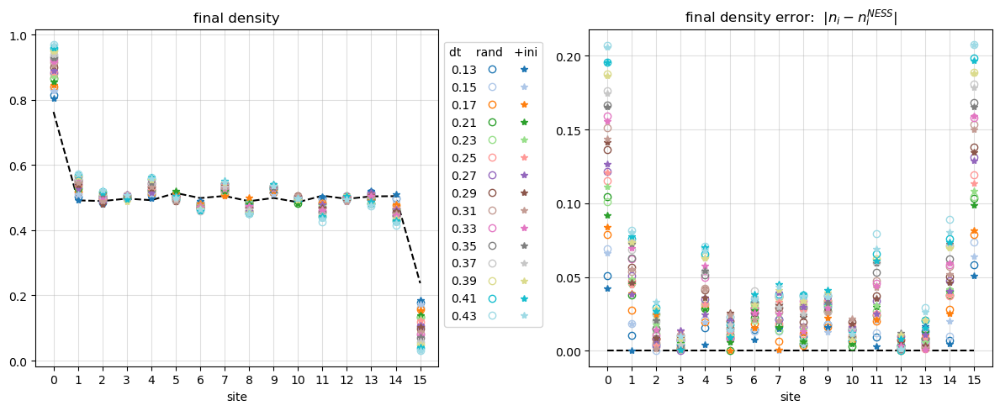

In [ ]:
saving_plots = True
folder_path = "/Users/arash/Downloads/plotting adams data/data_20250917/"
folder_path2 = "/Users/arash/Downloads/plotting adams data/data_20250917_2/"

n_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "n_avg")
params = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "params")
n_sq_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "n_sq_avg")
n_sem = np.sqrt(n_sq_avg - n_avg**2)/np.sqrt(num_iterations)

Nx = params['Nx']
Ny = params['Ny']
N = Nx * Ny

tr_steps=30
dt_list = [0.13, 0.15, 0.17, 0.21, 0.23, 0.25, 0.27, 0.29, 0.31, 0.33, 0.35, 0.37, 0.39, 0.41, 0.43]
# tr_steps=20 # dt_list = [0.15, 0.17, 0.20, 0.21, 0.23, 0.25, 0.26, 0.28, 0.30, 0.32, 0.34]

colors = get_colors(len(dt_list))

fig, ax = plt.subplots(1,2, figsize=(12,5))
ax[0].plot(np.arange(N), n_avg[:, -1], '--', c=f'k')#, label=f"ED")
ax[1].plot(np.arange(N), np.zeros(N), '--', c=f'k')#, label=f"ED")

for x, dtt in enumerate(dt_list):
    try:    
        file = glob.glob(f"{particle_name}_4x4_dt{dtt}_p{2*dtt}_b{b}_V{V}_steps{tr_steps}_trajectories????_current_random_pinned_corners_trotter{suffix}.h5", root_dir=folder_path2)[0]
        n_loop = load_key_from_hdf5(data_path2+file, "n_avg")
        ax[0].plot(np.arange(N, dtype=np.int8), n_loop[:,-1], ls='', marker='o', markerfacecolor='none', c=colors[x], label=f"{dtt:.2f}")

        data = np.abs(n_avg[:,-1]-n_loop[:,-1])#/n_avg[:,-1]
        ax[1].plot(np.arange(N, dtype=np.int8), data, ls='', marker='o', markerfacecolor='none', c=colors[x], label=f"{dtt:.2f}")

        # print(np.average(np.abs(n_avg[:,-1]-n_loop[:,-1])/n_avg[:,-1]))
    except Exception as e:
        # ax[0].plot(np.arange(N, dtype=np.int8), 0.5*np.ones(N), ls='', marker='o', markerfacecolor='none', c=f'none', label = f"{dtt:.2f}")
        # ax[1].plot(np.arange(N, dtype=np.int8), np.zeros(N), ls='', marker='o', markerfacecolor='none', c=f'none', label=f"{dtt:.2f}")
        print("error1:")
        print(f"{particle_name}_4x4_dt{dtt}_p{2*dtt}_b{b}_V{V}_steps{tr_steps}_trajectories????_current_random_pinned_corners_trotter{suffix}.h5")
        continue

ax[0].set_xlabel("site")
ax[0].set_xticks(range(N), range(N))#, rotation='vertical')
ax[0].set_title("final density")
ax[0].grid(alpha=0.4)

for x, dtt in enumerate(dt_list):
    try:
        file = glob.glob(f"{particle_name}_4x4_dt{dtt}_p{2*dtt}_b{b}_V{V}_steps{tr_steps}_trajectories????_current_random_NESS_pinned_corners_trotter{suffix}.h5", root_dir=folder_path2)[0]
        n_loop = load_key_from_hdf5(data_path2+file, "n_avg")
        ax[0].plot(np.arange(N, dtype=np.int8), n_loop[:,-1], ls='', marker='*', c=colors[x], label=" ")#label=f"{dtt:.2f}+")

        data = np.abs(n_avg[:,-1]-n_loop[:,-1])#/n_avg[:,-1]
        ax[1].plot(np.arange(N, dtype=np.int8), data, ls='', marker='*', c=colors[x], label=f"{dtt:.2f}")

        # print(np.average(np.abs(n_avg[:,-1]-n_loop[:,-1])/n_avg[:,-1]))
    except Exception as e:
        # ax[0].plot(np.arange(N, dtype=np.int8), 0.5*np.ones((N)), ls='', marker='*', c='none', label=' ')#label=f"{dtt:.2f}+")
        # ax[1].plot(np.arange(N, dtype=np.int8), np.zeros(N), ls='', marker='*', c=f'none', label=f"{dtt:.2f}")
        print("error")
        print(f"{particle_name}_4x4_dt{dtt}_p{2*dtt}_b{b}_V{V}_steps{tr_steps}_trajectories???_current_random_NESS_pinned_corners_trotter{suffix}.h5")
        continue
# plt.plot(t_list, dt* spead_avg[1]/(num_iterations), ':', c='k', label="E_avg")

ax[1].set_xlabel("site")
ax[1].set_title(r"final density error:  $|n_i - n_i^{NESS}|$")
ax[1].set_xticks(range(N), range(N))#, rotation='vertical')
ax[1].grid(alpha=0.4)

ax[0].legend(ncol=2, markerfirst=False,
           loc='upper left', bbox_to_anchor=(1.0, 0.98),
           title="dt"+" "*4+"rand"+" "*3+"+ini",
            columnspacing=0.2, handletextpad=0.25)

fig.tight_layout()
if saving_plots:
    newpath = folder_path +'plots/QC/'+particle_name+'/'
    if not os.path.exists(newpath) and saving_plots:
        os.makedirs(newpath)
    file_name = f"{Nx}x{Ny}_b{b}_V{V}_steps{tr_steps}_{drive_type}_pinned_corners"    
    plt.savefig(newpath + "DensityCompar_" + file_name + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)

## diagonal density & error compare

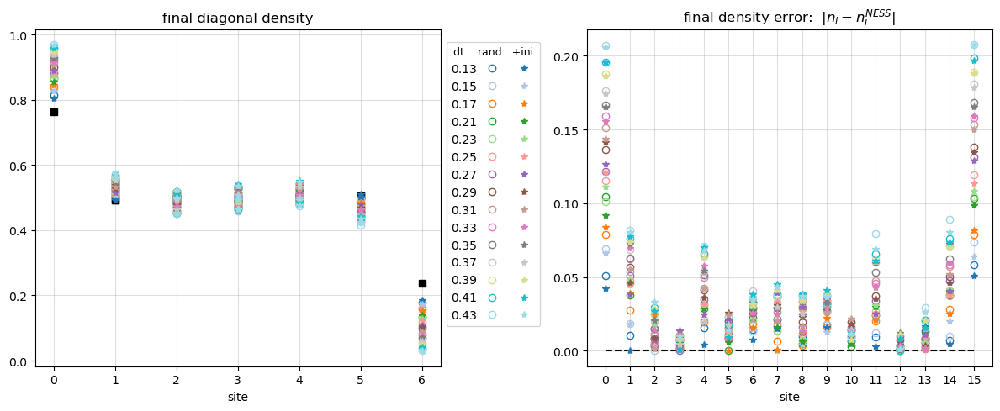

In [ ]:
n_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "n_avg")
params = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "params")
n_sq_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "n_sq_avg")
n_sem = np.sqrt(n_sq_avg - n_avg**2)/np.sqrt(num_iterations)

Nx = params['Nx']
Ny = params['Ny']
N = Nx * Ny

tr_steps=30
dt_list = [0.13, 0.15, 0.17, 0.21, 0.23, 0.25, 0.27, 0.29, 0.31, 0.33, 0.35, 0.37, 0.39, 0.41, 0.43]
# tr_steps=20 # dt_list = [0.15, 0.17, 0.20, 0.21, 0.23, 0.25, 0.26, 0.28, 0.30, 0.32, 0.34]

colors = get_colors(len(dt_list))

x_data = [number % Nx + number // Nx for number in range(N)]

fig, ax = plt.subplots(1,2, figsize=(12,5))
ax[0].plot(x_data, n_avg[:, -1], ls='', marker='s', c=f'k')#, label=f"ED")
ax[1].plot(np.arange(N), np.zeros(N), '--', c=f'k', label=f"NESS dt={dt}")

for x, dtt in enumerate(dt_list):
    try:    
        file = glob.glob(f"{particle_name}_4x4_dt{dtt}_p{2*dtt}_b{b}_V{V}_steps{tr_steps}_trajectories????_current_random_pinned_corners_trotter{suffix}.h5", root_dir=folder_path2)[0]
        n_loop = load_key_from_hdf5(data_path2+file, "n_avg")
        ax[0].plot(x_data, n_loop[:,30], ls='', marker='o', markerfacecolor='none', c=colors[x], label=f"{dtt:.2f}")

        data = np.abs(n_avg[:,-1]-n_loop[:,-1])#/n_avg[:,-1]
        ax[1].plot(np.arange(N, dtype=np.int8), data, ls='', marker='o', markerfacecolor='none', c=colors[x])#, label=f"{dtt:.2f}")

        # print(np.average(np.abs(n_avg[:,-1]-n_loop[:,-1])/n_avg[:,-1]))
    except Exception as e:
        # ax[0].plot(np.arange(N, dtype=np.int8), 0.5*np.ones(N), ls='', marker='o', markerfacecolor='none', c=f'none', label = f"{dtt:.2f}")
        # ax[1].plot(np.arange(N, dtype=np.int8), np.zeros(N), ls='', marker='o', markerfacecolor='none', c=f'none', label=f"{dtt:.2f}")
        print("error:")
        print(f"{particle_name}_4x4_dt{dtt}_p{2*dtt}_b{b}_V{V}_steps{tr_steps}_trajectories???_current_random_pinned_corners_trotter{suffix}.h5")
        continue

ax[0].set_xlabel("site")
ax[0].set_xticks(range(2*Nx-1), range(2*Nx-1))#, rotation='vertical')
ax[0].set_title("final diagonal density")
ax[0].grid(alpha=0.4)

for x, dtt in enumerate(dt_list):
    try:
        file = glob.glob(f"{particle_name}_4x4_dt{dtt}_p{2*dtt}_b{b}_V{V}_steps{tr_steps}_trajectories????_current_random_NESS_pinned_corners_trotter{suffix}.h5", root_dir=folder_path2)[0]
        n_loop = load_key_from_hdf5(data_path2+file, "n_avg")
        ax[0].plot(x_data, n_loop[:,-1], ls='', marker='*', c=colors[x], label=" ")#label=f"{dtt:.2f}+")

        data = np.abs(n_avg[:,-1]-n_loop[:,-1])#/n_avg[:,-1]
        ax[1].plot(np.arange(N, dtype=np.int8), data, ls='', marker='*', c=colors[x])#, label=f"{dtt:.2f}")

        # print(np.average(np.abs(n_avg[:,-1]-n_loop[:,-1])/n_avg[:,-1]))
    except Exception as e:
        # ax[0].plot(np.arange(N, dtype=np.int8), 0.5*np.ones((N)), ls='', marker='*', c='none', label=' ')#label=f"{dtt:.2f}+")
        # ax[1].plot(np.arange(N, dtype=np.int8), np.zeros(N), ls='', marker='*', c=f'none', label=f"{dtt:.2f}")
        print("error")
        print(f"{particle_name}_4x4_dt{dtt}_p{2*dtt}_b{b}_V{V}_steps{tr_steps}_trajectories???_current_random_NESS_pinned_corners_trotter{suffix}.h5")
        continue
# plt.plot(t_list, dt* spead_avg[1]/(num_iterations), ':', c='k', label="E_avg")

ax[1].set_xlabel("site")
ax[1].set_title(r"final density error:  $|n_i - n_i^{NESS}|$")
ax[1].set_xticks(range(N), range(N))#, rotation='vertical')
ax[1].grid(alpha=0.4)

ax[0].legend(ncol=2, markerfirst=False,
           loc='upper left', bbox_to_anchor=(1.0, 0.98),
           title="dt"+" "*4+"rand"+" "*3+"+ini",
           title_fontsize=9,
            columnspacing=0.2, handletextpad=0.25)
# ax[1].legend(loc='lower right', bbox_to_anchor=(-0.1, 0.0),
#            fontsize=9,)

fig.tight_layout()
if saving_plots and False:
    newpath = folder_path +'plots/QC/'+particle_name+'/'
    if not os.path.exists(newpath) and saving_plots:
        os.makedirs(newpath)
    file_name = f"{Nx}x{Ny}_b{b}_V{V}_steps{tr_steps}_{drive_type}_pinned_corners"    
    plt.savefig(newpath + "DensityCompar_" + file_name + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)

## current comparison

0.16657660994148005
0.19688296142179926
0.17010874189641706
0.2066329479562623
0.20082445173217295
0.2340279706962934
0.2764596664834351
0.31807271632634243
0.37047090963128465
0.4507865982933362
0.47395862654813603
0.5366836949141935
0.579006273259246
0.6253137922102401
0.6349432073152372
0.26562084555438614
0.26829269716955206
0.1888251249262722
0.2310844562893998
0.26327720909957186
0.2890699968335336
0.2870982720041303
0.39264782858109154
0.4399038352600767
0.4355966006901196
0.4779010507733094
0.5287985796837377
0.5777547262103122
0.6219232455500187
0.594955667292271


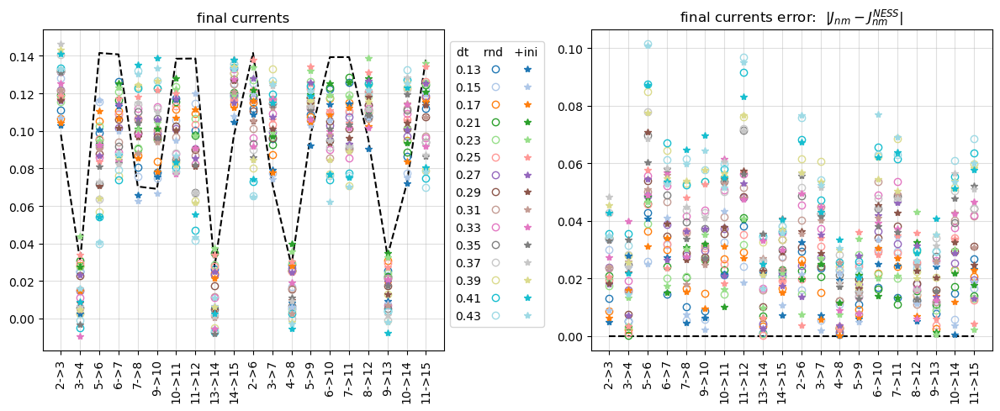

In [ ]:
avg_current = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "avg_currents")
params = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "params")
bonds = [f"{i}->{f}" for i,f in params['bonds']]
current_sq_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "currents_sq_avg")
sem_current = 5*np.sqrt(current_sq_avg - avg_current**2)/np.sqrt(num_iterations)
Nx = params['Nx']
Ny = params['Ny']
N = Nx * Ny

suffix = "_Adam" if not fermions else ""


tr_steps=30
dt_list = [0.13, 0.15, 0.17, 0.21, 0.23, 0.25, 0.27, 0.29, 0.31, 0.33, 0.35, 0.37, 0.39, 0.41, 0.43]
# tr_steps=20 # dt_list = [0.15, 0.17, 0.20, 0.21, 0.23, 0.25, 0.26, 0.28, 0.30, 0.32, 0.34]

fig, ax = plt.subplots(1,2, figsize=(12,5))

ax[0].plot(np.arange(20), avg_current[:, -1], '--', c=f'k')#, label=f"ED")
ax[1].plot(np.arange(20), np.zeros(20), '--', c=f'k')#, label=f"ED")
# plt.fill_between(np.arange(20), avg_current[:, -1] - sem_current[:, -1], avg_current[:, -1] + sem_current[:, -1], alpha=0.2, color=f"k")


for x, dtt in enumerate(dt_list):
    try:
        file = glob.glob(f"{particle_name}_4x4_dt{dtt}_p{2*dtt}_b{b}_V{V}_steps{tr_steps}_trajectories????_current_random_pinned_corners_trotter{suffix}.h5", root_dir=folder_path2)[0]
        current = load_key_from_hdf5(data_path2+file, "avg_currents")
        ax[0].plot(np.arange(20, dtype=np.int8), current[:,-1], ls='', marker='o', markerfacecolor='none', c=colors[x], label=f'{dtt:.2f}')

        data = np.abs((avg_current[:,-1]-current[:,-1]))#/avg_current[:,-1])
        ax[1].plot(np.arange(20, dtype=np.int8), data, ls='', marker='o', markerfacecolor='none', c=colors[x], label=f'{dtt:.2f}')
        print(np.average(np.abs((avg_current[:,-1]-current[:,-1])/avg_current[:,-1])))
    except Exception as e:
        print("error")
        print(f"{particle_name}_4x4_dt{dtt}_p{2*dtt}_b{b}_V{V}_steps{tr_steps}_trajectories????_current_random_pinned_corners_trotter{suffix}.h5")
        continue
# ax[0].set_xlabel("site")
ax[0].set_xticks(range(20), bonds, rotation='vertical')
# ax[0].set_ylabel("final currents")
ax[0].set_title("final currents")
ax[0].grid(alpha=0.4)


for x, dtt in enumerate(dt_list):
    try:    
        file = glob.glob(f"{particle_name}_4x4_dt{dtt}_p{2*dtt}_b{b}_V{V}_steps{tr_steps}_trajectories????_current_random_NESS_pinned_corners_trotter{suffix}.h5", root_dir=folder_path2)[0]
        current = load_key_from_hdf5(data_path2+file, "avg_currents")
        ax[0].plot(np.arange(20, dtype=np.int8), current[:,-1], ls='', marker='*', c=colors[x], label=" ")#f'{dtt:.2f}')

        data = np.abs((avg_current[:,-1]-current[:,-1]))#/avg_current[:,-1])
        ax[1].plot(np.arange(20, dtype=np.int8), data, ls='', marker='*', c=colors[x], label=f'{dtt:.2f}')
    
        print(np.average(np.abs((avg_current[:,-1]-current[:,-1])/avg_current[:,-1])))

    except Exception as e:
        print("error")
        print(f"{particle_name}_4x4_dt{dtt}_p{2*dtt}_b{b}_V{V}_steps{tr_steps}_trajectories750_current_random_NESS_pinned_corners_trotter{suffix}.h5")
        continue

# ax[1].set_xlabel("site")
# ax[1].set_ylabel(r"final currents error:  $|J_{nm} - J_{nm}^{NESS}|$")
ax[1].set_title(r"final currents error:  $|J_{nm} - J_{nm}^{NESS}|$")
ax[1].set_xticks(range(20), bonds, rotation='vertical')
ax[1].grid(alpha=0.4)


ax[0].legend(ncol=2, markerfirst=False,
           loc='upper left', bbox_to_anchor=(1.0, 0.98),
           title="dt"+" "*4+"rnd"+" "*3+"+ini",
            columnspacing=0.2, handletextpad=0.25)

fig.tight_layout()
if saving_plots:
    newpath = folder_path +'plots/QC/'+particle_name+'/'
    if not os.path.exists(newpath) and saving_plots:
        os.makedirs(newpath)
    file_name = f"{Nx}x{Ny}_b{b}_V{V}_steps{tr_steps}_{drive_type}_pinned_corners"        
    plt.savefig(newpath + "CurrentCompar_" + file_name + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)

---
# NJ error comparison

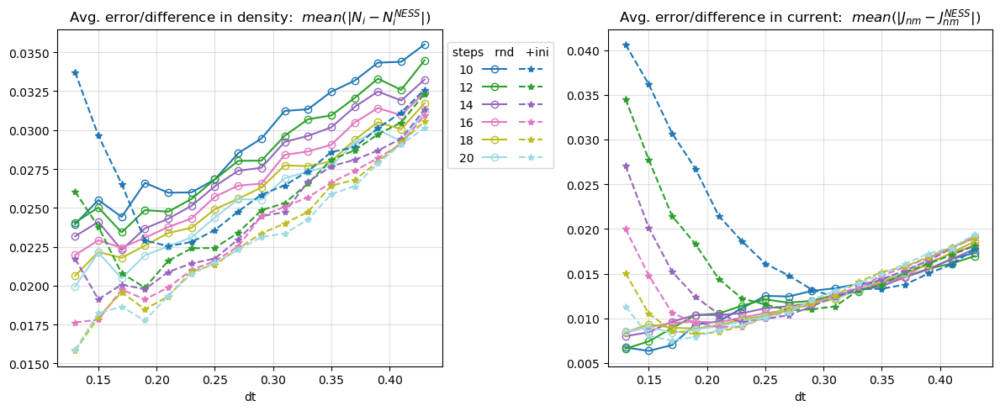

In [54]:
inizi=True

n_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "n_avg")
avg_current = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "avg_currents")

params = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "params")
bonds = [f"{i}->{f}" for i,f in params['bonds']]

n_sq_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "n_sq_avg")
n_sem = np.sqrt(n_sq_avg - n_avg**2)/np.sqrt(num_iterations)

current_sq_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "currents_sq_avg")
sem_current = 5*np.sqrt(current_sq_avg - avg_current**2)/np.sqrt(num_iterations)

Nx = params['Nx']
Ny = params['Ny']
N = Nx * Ny

suffix = "_Adam" if not fermions else ""

tr_steps=30
dt_list = [0.13, 0.15, 0.17, 0.19, 0.21, 0.23, 0.25, 0.27, 0.29, 0.31, 0.33, 0.35, 0.37, 0.39, 0.41, 0.43]
T_list = [10, 12, 14, 16, 18, 20]
# tr_steps=20 # dt_list = [0.15, 0.17, 0.20, 0.21, 0.23, 0.25, 0.26, 0.28, 0.30, 0.32, 0.34]

fig, ax = plt.subplots(1,2, figsize=(12,5))
colors = get_colors(6)

for t, T_step in enumerate(T_list):
    n_data_1, c_data_1 = [], []
    for x, dtt in enumerate(dt_list):
        equiv_time = int(np.round(dtt*T_step/dt, decimals=0))
        file1 = glob.glob(f"{particle_name}_4x4_dt{dtt}_p{2*dtt}_b{b}_V{V}_steps{tr_steps}_trajectories????_current_random_pinned_corners_trotter{suffix}.h5", root_dir=data_path)[0] 
        
        density1 = load_key_from_hdf5(data_path+file1, "n_avg")
        current1 = load_key_from_hdf5(data_path+file1, "avg_currents")
        
        n1 = np.mean(np.abs(n_avg[:,-1] - density1[:,T_step]))#/n_avg[:,-1])
        c1 = np.mean(np.abs((avg_current[:,-1]-current1[:,T_step])))#/avg_current[:,-1]))

        n_data_1.append(n1)
        c_data_1.append(c1)
    
    ax[0].plot(dt_list, n_data_1, ls='-', c=colors[t], marker='o', markerfacecolor='none', label=f"{T_step}")
    ax[1].plot(dt_list, c_data_1, ls='-',c=colors[t], marker='o', markerfacecolor='none', label=f"{T_step}")

if inizi:
    for t, T_step in enumerate(T_list):
        equiv_time = int(np.round(dtt*T_step/dt, decimals=0))
        n_data_2, c_data_2 = [], []
        for x, dtt in enumerate(dt_list):
            file2 = glob.glob(f"{particle_name}_4x4_dt{dtt}_p{2*dtt}_b{b}_V{V}_steps{tr_steps}_trajectories????_current_random_NESS_pinned_corners_trotter{suffix}.h5", root_dir=data_path)[0]
            
            density2 = load_key_from_hdf5(data_path+file2, "n_avg")
            current2 = load_key_from_hdf5(data_path+file2, "avg_currents")
            
            n2 = np.mean(np.abs(n_avg[:,-1] - density2[:,T_step]))#/n_avg[:,-1])
            c2 = np.mean(np.abs((avg_current[:,-1]-current2[:,T_step])))#/avg_current[:,-1]))

            n_data_2.append(n2)
            c_data_2.append(c2)
        
        ax[0].plot(dt_list, n_data_2, ls='--', c=colors[t], marker='*', label=f" ")
        ax[1].plot(dt_list, c_data_2, ls='--', c=colors[t],marker='*', label=f" ")
    

ax[0].set_title(r"Avg. error/difference in density:  $mean(|N_{i} - N^{NESS}_{i}|)$")
ax[0].set_xlabel("dt")
ax[0].grid(alpha=0.4)
ax[0].legend(ncol=1+int(inizi), 
            markerfirst=False,
            loc='upper left', bbox_to_anchor=(1.0, 0.98),
            title="steps"+" "*3+"rnd"+" "*3+"+ini" if inizi else "steps",
            # title="steps",
            columnspacing=0.05, 
            handletextpad=0.75
            )

ax[1].set_title(r"Avg. error/difference in current:  $mean(|J_{nm} - J^{NESS}_{nm}|)$")
ax[1].set_xlabel("dt")
ax[1].grid(alpha=0.4)
# ax[1].legend()

fig.tight_layout()
if saving_plots:
    newpath = folder_path +'plots/QC/'+particle_name+'/'
    if not os.path.exists(newpath) and saving_plots:
        os.makedirs(newpath)
    file_name = f"{Nx}x{Ny}_b{b}_V{V}_steps{tr_steps}_{drive_type}_pinned_corners"        
    plt.savefig(newpath + "Errors_" + file_name + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)

## N-J SCORE

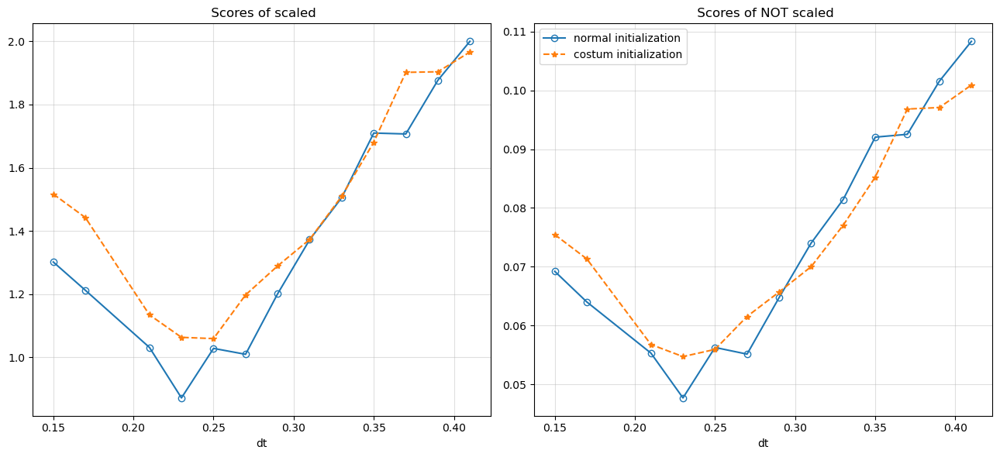

In [64]:

fig, ax = plt.subplots(1,2, figsize=(13,6))
# ax[0].plot(np.arange(N), n_avg[:, -1], '--', c=f'k')#, label=f"ED")
# ax[0].plot(np.arange(N), np.zeros(N), '--', c=f'k')#, label=f"ED")

ax[0].plot(dt_list, np.array(c_data_1/np.max(c_data_1)) + np.array(n_data_1/np.max(n_data_1)), ls='-', marker='o', markerfacecolor='none', c=f'C{0}', label="norm")#f'{dtt:.2f}')
ax[0].plot(dt_list, np.array(c_data_2/np.max(c_data_2)) + np.array(n_data_2/np.max(n_data_2)), ls='--', marker='*', c=f'C{1}', label="plus")#f'{dtt:.2f}')

ax[1].plot(dt_list, np.array(c_data_1) + np.array(n_data_1), ls='-', marker='o', markerfacecolor='none', c=f'C{0}', label="normal initialization")#f'{dtt:.2f}')
ax[1].plot(dt_list, np.array(c_data_2) + np.array(n_data_2), ls='--', marker='*', c=f'C{1}', label="costum initialization")#f'{dtt:.2f}')



ax[0].set_title(r" Scores of scaled")
ax[0].set_xlabel("dt")
ax[0].grid(alpha=0.4)
# ax[0].legend()

ax[1].set_title(r" Scores of NOT scaled")
ax[1].set_xlabel("dt")
ax[1].grid(alpha=0.4)
ax[1].legend()

fig.tight_layout()
if saving_plots:
    newpath = folder_path +'plots/QC/'+particle_name+'/'
    if not os.path.exists(newpath) and saving_plots:
        os.makedirs(newpath)
    file_name = f"{Nx}x{Ny}_b{b}_V{V}_steps{tr_steps}_{drive_type}_pinned_corners"        
    plt.savefig(newpath + "Scores_" + file_name + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)

---
# Selected Diagonal Densities

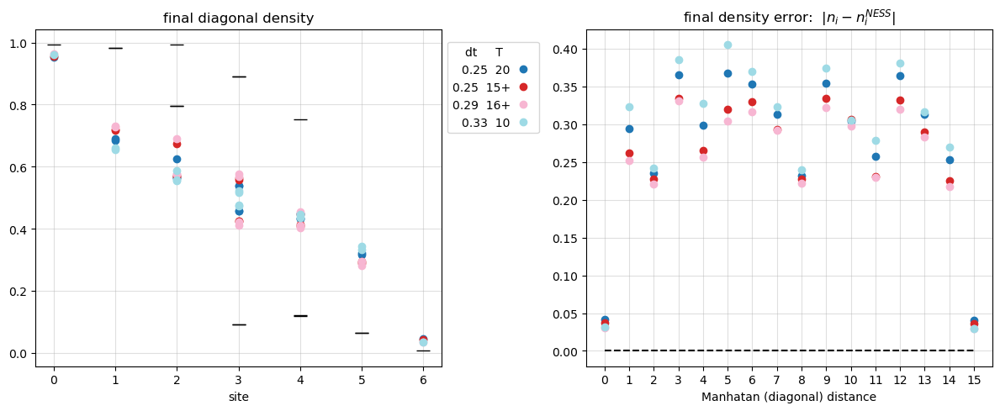

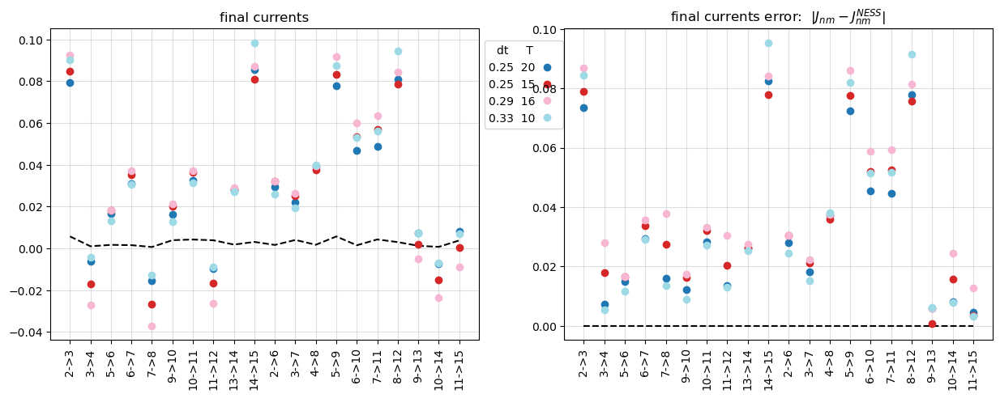

In [68]:
#Bos V=0.0
# QC_input = [(16,0.21,False),(14,0.23,False),(12,0.25,False),(10,0.31,False)]
#Bos V=4.0
QC_input = [(20,0.25,False),(15,0.25,True),(16,0.29,True),(10,0.33,False)]
#Bos V=2.0
# QC_input = [(18,0.25,False),(16,0.27,True),(14,0.31,True),(12,0.35,True)]
#Bos V=1.0
# QC_input = [(18,0.19,False),(16,0.21,True),(14,0.23,True),(12,0.27,True)]
##Fer V=0.0, B=0.0
# QC_input = [(16,0.33,False),(14,0.29,False),(12,0.35,False),(10,0.27,False)]
##Fer V=0.5, B=0.5
# QC_input = [(16,0.29,False),(14,0.29,False),(12,0.31,False),(10,0.23,False)]
##Fer V=1.0, B=0.5
# QC_input = [(16,0.21,False),(14,0.23,False),(12,0.25,False),(10,0.25,False)]
##Fer V=0.0, B=1.0
# QC_input = [(16,0.29,False),(14,0.31,False),(12,0.37,False),(10,0.43,False)]

n_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "n_avg")
params = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "params")
n_sq_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "n_sq_avg")
n_sem = np.sqrt(n_sq_avg - n_avg**2)/np.sqrt(num_iterations)
avg_current = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "avg_currents")
current_sq_avg = load_key_from_hdf5(data_path+f"{particle_name}_" + f"{filename}.h5", "currents_sq_avg")
sem_current = 5*np.sqrt(current_sq_avg - avg_current**2)/np.sqrt(num_iterations)


Nx = params['Nx']
Ny = params['Ny']
N = Nx * Ny
bonds = [f"{i}->{f}" for i,f in params['bonds']]

tr_steps=30

colors = get_colors(len(QC_input))

x_data = [number % Nx + number // Nx for number in range(N)]

fig, ax = plt.subplots(1,2, figsize=(12,5))
ax[0].plot(x_data, n_avg[:, -1], ls='', marker='_', markersize=12, c=f'k')#, label=f"ED")
ax[1].plot(np.arange(N), np.zeros(N), '--', c=f'k', label=f"NESS dt={dt}")

Fig, Ax = plt.subplots(1,2, figsize=(15,5))
Ax[0].plot(np.arange(20), avg_current[:, -1], '--', c=f'k')#, label=f"ED")
Ax[1].plot(np.arange(20), np.zeros(20), '--', c=f'k')#, label=f"ED")

for x, (tt_step, dtt, iniz) in enumerate(QC_input):
    try:
        midfix = "_NESS" if iniz else ""
        plus = "+" if iniz else ""    
        file = glob.glob(f"{particle_name}_4x4_dt{dtt}_p{2*dtt}_b{b}_V{V}_steps{tr_steps}_trajectories????_current_random{midfix}_pinned_corners_trotter{suffix}.h5", root_dir=data_path)[0]
        n_loop = load_key_from_hdf5(data_path+file, "n_avg")
        ax[0].plot(x_data, n_loop[:,tt_step], ls='', marker='o', c=colors[x], label=f"{dtt:.2f}  {tt_step}{plus}")

        data = np.abs(n_avg[:,-1]-n_loop[:,tt_step])#/n_avg[:,-1]
        ax[1].plot(np.arange(N, dtype=np.int8), data, ls='', marker='o', c=colors[x])#, label=f"{dtt:.2f}")

        current = load_key_from_hdf5(data_path+file, "avg_currents")
        Ax[0].plot(np.arange(20, dtype=np.int8), current[:,tt_step], ls='', marker='o', c=colors[x], label=f'{dtt:.2f}  {tt_step}')

        cata = np.abs((avg_current[:,-1]-current[:,tt_step]))#/avg_current[:,-1])
        Ax[1].plot(np.arange(20, dtype=np.int8), cata, ls='', marker='o', c=colors[x])#, label=f'{dtt:.2f}')

    except Exception as e:
        print("error:")
        print(f"{particle_name}_4x4_dt{dtt}_p{2*dtt}_b{b}_V{V}_steps{tr_steps}_trajectories???_current_random_pinned_corners_trotter{suffix}.h5")
        continue

ax[0].set_xlabel("site")
ax[0].set_xticks(range(2*Nx-1), range(2*Nx-1))#, rotation='vertical')
ax[0].set_title("final diagonal density")
ax[0].grid(alpha=0.4)


ax[1].set_xlabel("Manhatan (diagonal) distance")
ax[1].set_title(r"final density error:  $|n_i - n_i^{NESS}|$")
ax[1].set_xticks(range(N), range(N))#, rotation='vertical')
ax[1].grid(alpha=0.4)

ax[0].legend(ncol=1, markerfirst=False,
           loc='upper left', bbox_to_anchor=(1.0, 0.98),
           title="dt"+" "*5+"T"+" "*5,
           title_fontsize=10,
            columnspacing=0.05, handletextpad=0.05)

Ax[0].set_xticks(range(20), bonds, rotation='vertical')
Ax[0].set_title("final currents")
Ax[0].grid(alpha=0.4)
Ax[1].set_title(r"final currents error:  $|J_{nm} - J_{nm}^{NESS}|$")
Ax[1].set_xticks(range(20), bonds, rotation='vertical')
Ax[1].grid(alpha=0.4)
Ax[0].legend(ncol=1, markerfirst=False,
           loc='upper left', bbox_to_anchor=(1.0, 0.98),
           title="dt"+" "*5+"T"+" "*5,
            columnspacing=0.05, handletextpad=0.05)


fig.tight_layout()
if saving_plots and True:
    newpath = folder_path +'plots/QC/'+particle_name+'/'
    if not os.path.exists(newpath) and saving_plots:
        os.makedirs(newpath)
    file_name = f"{Nx}x{Ny}_b{b}_V{V}_steps{tr_steps}_{drive_type}_pinned_corners"    
    fig.savefig(newpath + "DensityCompar_" + file_name + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)
    Fig.savefig(newpath + "CurrentCompar_" + file_name + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)

---
# tests

/var/folders/59/70dtxv4168l9_4y1wvmypnfc0000gn/T/ipykernel_13091/321063358.py:93: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


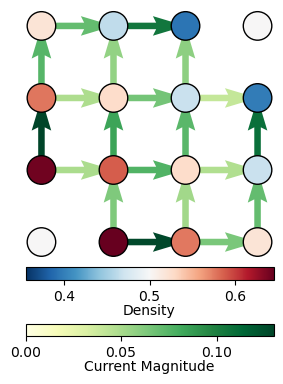

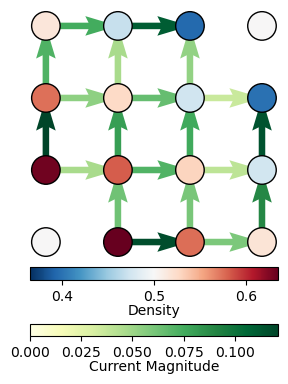

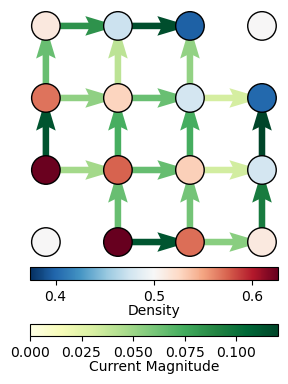

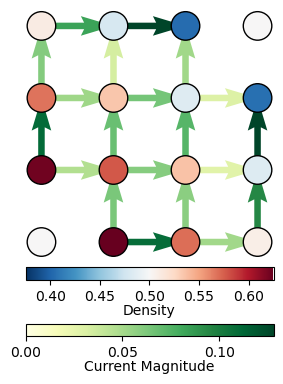

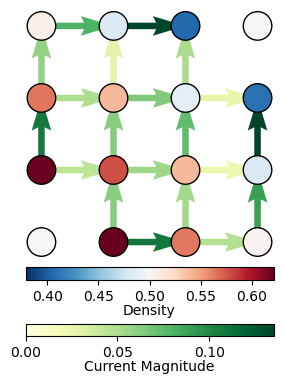

...

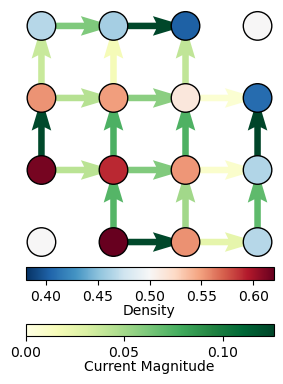

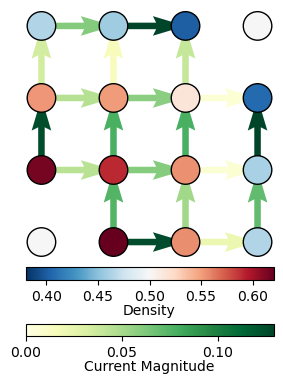

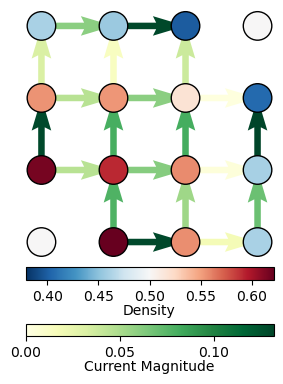

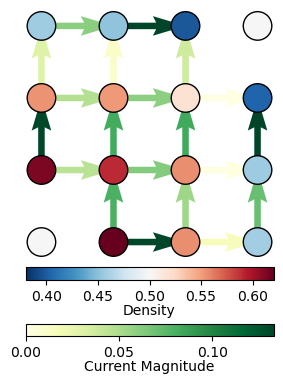

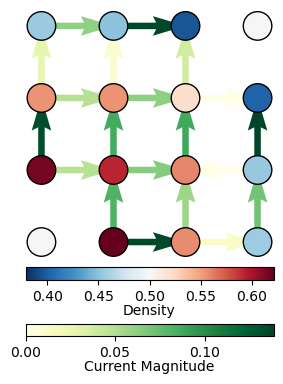

In [19]:
fermions = False # Whether to use fermionic statistics
Nx, Ny = 4, 4
N = Nx*Ny
V = 1.5
b = 0.0 #2/((Nx-1)*(Ny-1))  # Magnetic field strength
# num_iterations = 9886
steps = 30
initialization = True

site_in = 1  # Site where the current is injected
drive_type = "current"  # :current, :dephasing
initial_state = "random"  # :checkerboard, :empty, :filled, :random, :custom
B = b*np.pi # Magnetic field in units of flux quantum
site_out = N  # Site where the current is extracted
even_parity = False  # Whether to use even parity
pinned_corners = True  # Whether to pin the corners of the lattice
single_shot = False  # Whether to perform single shot measurements

trotter_evo = True
cir_typ = "Adam" #"Anna"

suffix = "_Adam" if not fermions else ""
midfix = "_custom" if initialization else ""

if fermions:
    # filename = "fermions_"
    particle_name = "fermions"
    sbfldr2 = f"B{b}_V{V}/"
else:
    # filename = "bosons_"
    particle_name = "bosons"
    sbfldr2 = f"V{V}/"

sbfldr1 = f"QC" if trotter_evo else "HM"
newpath = folder_path +'plots/'+sbfldr1+'/'+particle_name+f'/NESS/'+sbfldr2

if not os.path.exists(newpath) and saving_plots:
    print("file created")
    os.makedirs(newpath)

dt_list = [0.13, 0.15, 0.17, 0.19, 0.21, 0.23, 0.25, 0.27, 0.29, 0.31, 0.33, 0.35, 0.37, 0.39, 0.41, 0.43]
T_list = [10, 12, 14, 16, 18, 20]

for t, T_step in enumerate(T_list):
    # equiv_time = int(np.round(dtt*T_step/dt, decimals=0))
    time_step = T_step

    for dtt in dt_list:
        p = 2*dtt#0.5

        # print(f"{particle_name}_4x4_dt{dtt}_p{p}_b{b}_V{V}_steps{steps}_trajectories????_current_random{midfix}_pinned_corners_trotter{suffix}.h5")
        file = glob.glob(f"{particle_name}_4x4_dt{dtt}_p{p}_b{b}_V{V}_steps{steps}_trajectories????_current_random{midfix}_pinned_corners_trotter{suffix}.h5", root_dir=data_path)[0]
        n_avg = load_key_from_hdf5(data_path+file, "n_avg").T
        avg_currents = load_key_from_hdf5(data_path+file, "avg_currents").T
        params = load_key_from_hdf5(data_path+file, "params")
        t_list = load_key_from_hdf5(data_path+file, "t_list")
        # num_iterations = load_key_from_hdf5(folder_path+file, "completed_trajectories")
        num_iterations = 5000
        Nx = params['Nx']
        Ny = params['Ny']
        N = Nx * Ny
        bonds = params['bonds']

        max_color = 0.5 + np.max(np.abs(n_avg[time_step,1:14]-0.5))
        min_color = 0.5 - np.max(np.abs(n_avg[time_step,1:14]-0.5))
        # print(max_color, " , ", min_color)

        plotting_threshold = 0.0  # Threshold for plotting currents
        marker_size = 750 * (3/Nx)**2  # Size of the markers for the density plot
        arrow_width = 0.035 * 3/Nx  # Width of the arrows in the quiver plot

        # single line definition of empty lists for X, Y, U, V, C
        X = []; Y = []; U1 = []; U2 = []; C = []
        for i, bond in enumerate(bonds):
            # convert back from n to x,y coordinates
            x1, y1 = (bond[0]-1) % Nx, (bond[0]-1) // Nx
            x2, y2 = (bond[1]-1) % Nx, (bond[1]-1) // Nx

            if np.abs(avg_currents[time_step,i]) > plotting_threshold*np.abs(avg_currents[time_step,:]).max():
                C.append(np.abs(avg_currents[time_step,i]))

                if np.real(avg_currents[time_step,i]) > 0:
                    X.append(x1)
                    Y.append(y1)
                    U1.append(x2-x1)
                    U2.append(y2-y1)
                else:
                    X.append(x2)
                    Y.append(y2)
                    U1.append(x1-x2)
                    U2.append(y1-y2)

        fig, ax = plt.subplots()

        p1 = ax.quiver(X, Y, U1, U2, C, cmap="YlGn", angles='xy', scale_units='xy', scale=1, width=arrow_width)
        p1.set_clim(0, np.max(C))
        cb1 = plt.colorbar(p1, ax=ax, orientation='horizontal', shrink=0.5, pad=0.03)
        cb1.set_label('Current Magnitude', labelpad=0)

        X = []; Y = []; C = []
        for x in range(Nx):
            for y in range(Ny):
                n = x % Nx + y*Nx
                X.append(x)
                Y.append(y)
                # C.append(n_avg[time_step,n])
                if n == 0 or n == 15:
                    C.append(0.5)
                else:
                    C.append(n_avg[time_step,n])

        # p2 = ax.scatter(X, Y, c=C, cmap="RdBu_r", s=marker_size, edgecolors= "black", vmin=0, vmax=1)
        p2 = ax.scatter(X, Y, c=C, cmap="RdBu_r", s=marker_size, edgecolors= "black", vmin=min_color, vmax=max_color)
        cb2 = plt.colorbar(p2, ax=ax, orientation='horizontal', shrink=0.5, pad=0.03)
        cb2.set_label('Density', labelpad=0)

        # Add automatic padding to prevent cutoff
        ax.margins(0.1 * 3/Nx)  # Add padding around the data
        # Alternatively, you could use: ax.set_xlim(-0.5, Nx-0.5); ax.set_ylim(-0.5, Ny-0.5)

        ax.set_axis_off()
        ax.set_aspect('equal')

        if saving_plots and True:
            save_filename = f"{Nx}x{Ny}_dt{dtt}_p{p}_b{b}_V{V}_steps{time_step}_trajectories{num_iterations}_{drive_type}_{initial_state}{midfix}"
            plt.savefig(newpath + "TEST_NESS_" + save_filename + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)
            # print(f"{particle_name}_4x4_dt{dtt}_p{p}_b{b}_V{V}_steps{tr_steps}_trajectories????_current_random{midfix}_pinned_corners_trotter{suffix}.h5")


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


fermions_4x4_dt0.13_p0.26_b1.0_V0.0_steps30_trajectories????_current_random_NESS_pinned_corners_trotter.h5


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


fermions_4x4_dt0.15_p0.3_b1.0_V0.0_steps30_trajectories????_current_random_NESS_pinned_corners_trotter.h5


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


fermions_4x4_dt0.17_p0.34_b1.0_V0.0_steps30_trajectories????_current_random_NESS_pinned_corners_trotter.h5
fermions_4x4_dt0.21_p0.42_b1.0_V0.0_steps30_trajectories????_current_random_NESS_pinned_corners_trotter.h5


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


fermions_4x4_dt0.23_p0.46_b1.0_V0.0_steps30_trajectories????_current_random_NESS_pinned_corners_trotter.h5


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


fermions_4x4_dt0.25_p0.5_b1.0_V0.0_steps30_trajectories????_current_random_NESS_pinned_corners_trotter.h5


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


fermions_4x4_dt0.27_p0.54_b1.0_V0.0_steps30_trajectories????_current_random_NESS_pinned_corners_trotter.h5


/var/folders/59/70dtxv4168l9_4y1wvmypnfc0000gn/T/ipykernel_13091/60602485.py:106: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  KRS, krs = plt.subplots(1,1)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


fermions_4x4_dt0.29_p0.58_b1.0_V0.0_steps30_trajectories????_current_random_NESS_pinned_corners_trotter.h5
fermions_4x4_dt0.31_p0.62_b1.0_V0.0_steps30_trajectories????_current_random_NESS_pinned_corners_trotter.h5


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


fermions_4x4_dt0.33_p0.66_b1.0_V0.0_steps30_trajectories????_current_random_NESS_pinned_corners_trotter.h5


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


fermions_4x4_dt0.35_p0.7_b1.0_V0.0_steps30_trajectories????_current_random_NESS_pinned_corners_trotter.h5


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


fermions_4x4_dt0.37_p0.74_b1.0_V0.0_steps30_trajectories????_current_random_NESS_pinned_corners_trotter.h5


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


fermions_4x4_dt0.39_p0.78_b1.0_V0.0_steps30_trajectories????_current_random_NESS_pinned_corners_trotter.h5


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


fermions_4x4_dt0.41_p0.82_b1.0_V0.0_steps30_trajectories????_current_random_NESS_pinned_corners_trotter.h5


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


fermions_4x4_dt0.43_p0.86_b1.0_V0.0_steps30_trajectories????_current_random_NESS_pinned_corners_trotter.h5


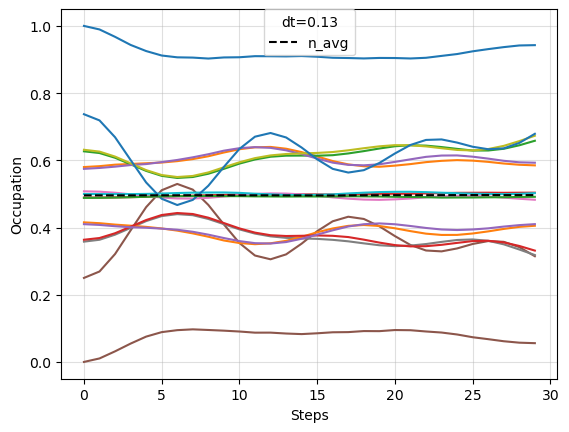

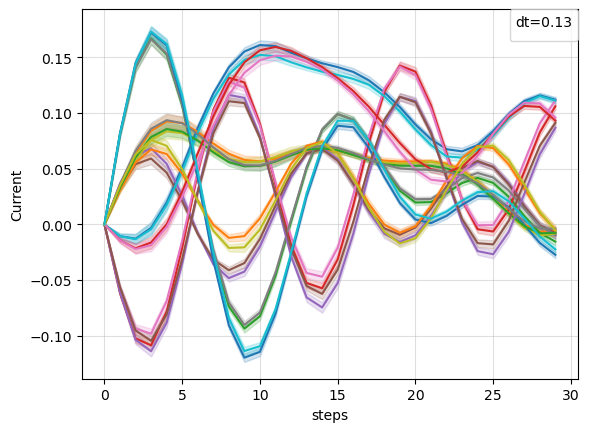

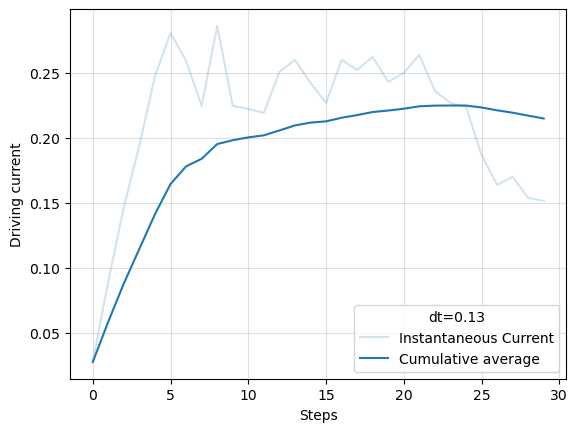

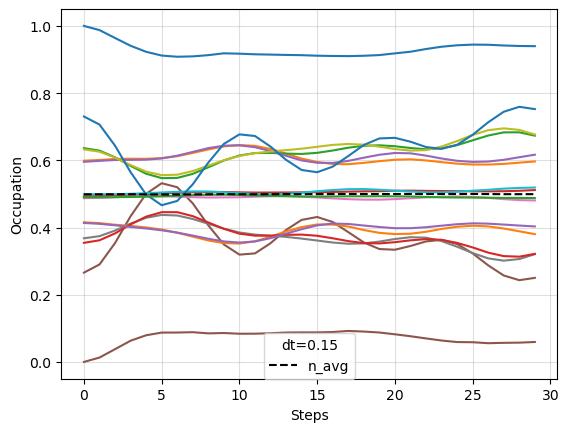

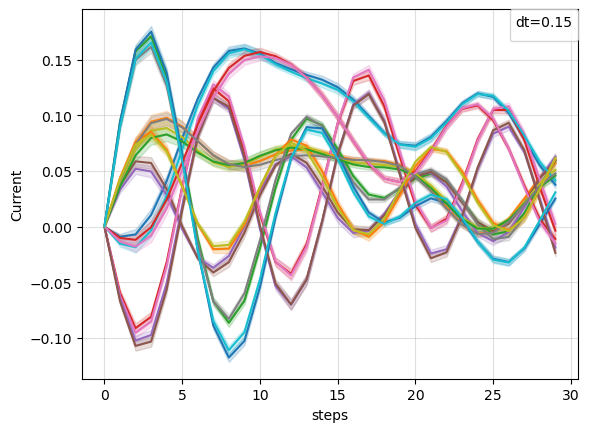

...

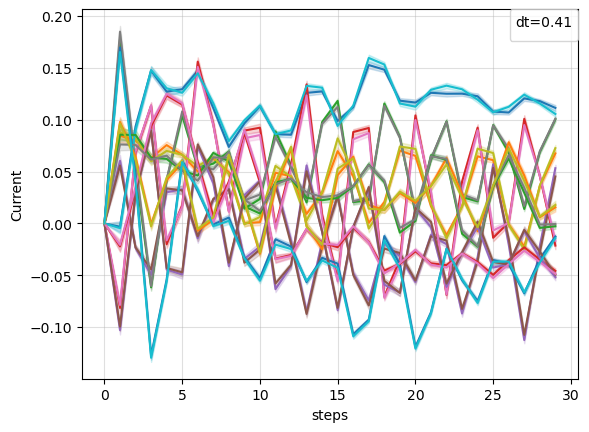

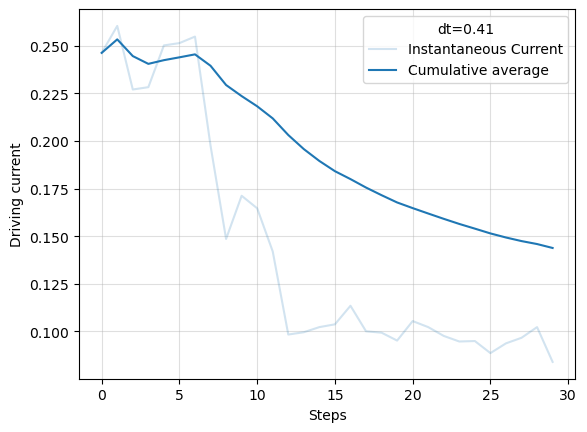

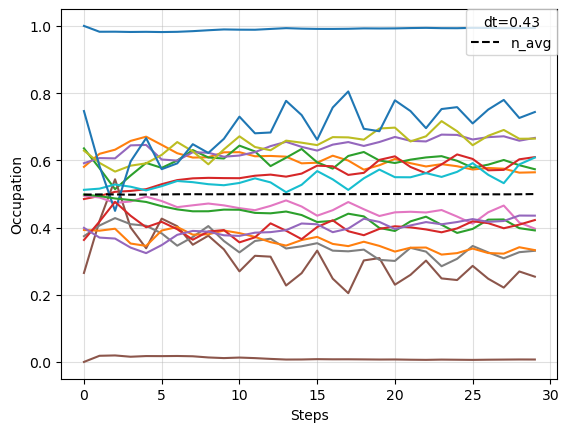

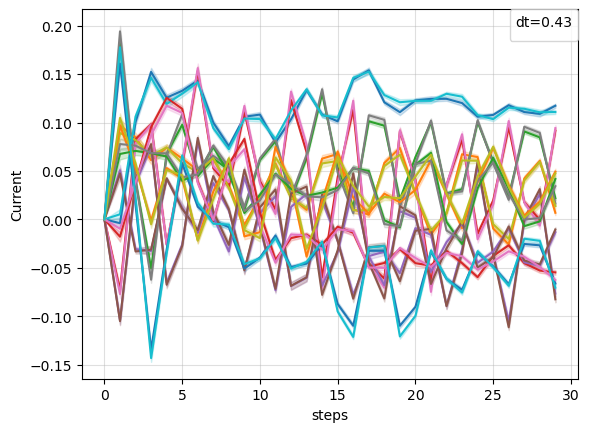

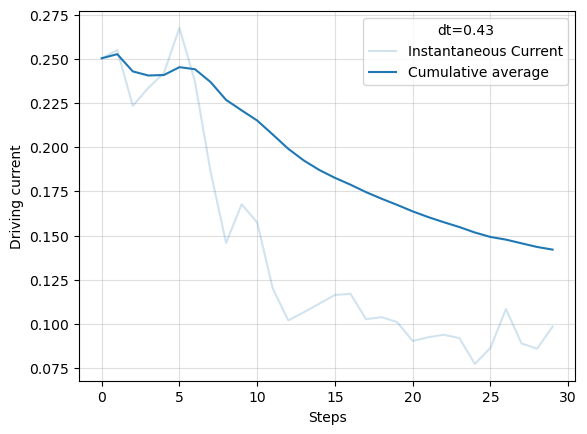

In [7]:
fermions = True # Whether to use fermionic statistics
Nx, Ny = 4, 4
N = Nx*Ny
V = 0.0
b = 1.0 #2/((Nx-1)*(Ny-1))  # Magnetic field strength
# num_iterations = 9886
steps = 30
initialization = True

site_in = 1  # Site where the current is injected
drive_type = "current"  # :current, :dephasing
initial_state = "random"  # :checkerboard, :empty, :filled, :random, :custom
B = b*np.pi # Magnetic field in units of flux quantum
site_out = N  # Site where the current is extracted
even_parity = False  # Whether to use even parity
pinned_corners = True  # Whether to pin the corners of the lattice
single_shot = False  # Whether to perform single shot measurements

trotter_evo = True
cir_typ = "Adam" #"Anna"

suffix = "_Adam" if not fermions else ""
midfix = "_NESS" if initialization else ""

if fermions:
    # filename = "fermions_"
    particle_name = "fermions"
    sbfldr2 = f"B{b}_V{V}/"
else:
    # filename = "bosons_"
    particle_name = "bosons"
    sbfldr2 = f"V{V}/"

sbfldr1 = f"QC" if trotter_evo else "HM"
newpath = folder_path +'plots/'+sbfldr1+'/'+particle_name+f'/traces/'+sbfldr2
# newpath = folder_path +'plots/'+sbfldr1+'/'+particle_name+f'/'#+sbfldr2

if not os.path.exists(newpath) and saving_plots:
    print("file created")
    os.makedirs(newpath)

dt_list = [0.13, 0.15, 0.17, 0.21, 0.23, 0.25, 0.27, 0.29, 0.31, 0.33, 0.35, 0.37, 0.39, 0.41, 0.43]
T_list = [10, 12, 14, 16, 18, 20]

limm=30

for dtt in dt_list:
    p = 2*dtt#0.5

    print(f"{particle_name}_4x4_dt{dtt}_p{p}_b{b}_V{V}_steps{steps}_trajectories????_current_random{midfix}_pinned_corners_trotter{suffix}.h5")
    file = glob.glob(f"{particle_name}_4x4_dt{dtt}_p{p}_b{b}_V{V}_steps{steps}_trajectories????_current_random{midfix}_pinned_corners_trotter{suffix}.h5", root_dir=data_path)[0]
    n_avg = load_key_from_hdf5(data_path+file, "n_avg")
    avg_currents = load_key_from_hdf5(data_path+file, "avg_currents")
    currents_sq_avg = load_key_from_hdf5(data_path+file, "currents_sq_avg")
    params = load_key_from_hdf5(data_path+file, "params")
    t_list = load_key_from_hdf5(data_path+file, "t_list")
    K_avg = load_key_from_hdf5(data_path+file, "K_avg")
    spead_avg = load_key_from_hdf5(data_path+file, "speed_avg")
    
    # num_iterations = load_key_from_hdf5(folder_path+file, "completed_trajectories")
    num_iterations = 5000
    Nx = params['Nx']
    Ny = params['Ny']
    N = Nx * Ny
    bonds = params['bonds']

    sem_currents = np.sqrt(currents_sq_avg - avg_currents**2)/np.sqrt(num_iterations)



    save_filename = f"{Nx}x{Ny}_dt{dtt}_p{p}_b{b}_V{V}_steps{steps}_trajectories{num_iterations}_{drive_type}_{initial_state}{midfix}"
    
    DEN, den = plt.subplots(1,1)
    for i in range(N):
        den.plot(range(limm), n_avg[i,0:limm])#, label=f"n_{i}")
   
    den.plot(range(limm), np.sum(n_avg[:,:limm], axis=0)/(N), '--', c='k', label="n_avg")
    den.set_xlabel("Steps")
    den.set_ylabel("Occupation")
    den.legend(#bbox_to_anchor=(1.01, 1), loc='upper left', 
               title = f"dt={dtt}",
            borderaxespad=0.)
    den.grid(alpha=0.4)

    if saving_plots:
        DEN.savefig(newpath + "density_" + save_filename + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)


    CUR, cur = plt.subplots(1,1)
    for i, bond in enumerate(bonds):
        # cur.fill_between(t_list[:limm], avg_currents[i,:limm] - sem_currents[i,:limm], avg_currents[i,:limm] + sem_currents[i,:limm], alpha=0.2, color=f"C{i}")
        # cur.plot(t_list[:limm], avg_currents[i,:limm], label=f"{bond[0]}-{bond[1]}", color=f"C{i}")
        cur.fill_between(range(limm), avg_currents[i,:limm] - sem_currents[i,:limm], avg_currents[i,:limm] + sem_currents[i,:limm], alpha=0.2, color=f"C{i}")
        cur.plot(range(limm), avg_currents[i,:limm], color=f"C{i}") #, label=f"{bond[0]}-{bond[1]}"
    cur.set_xlabel("steps")
    cur.set_ylabel("Current")
    cur.legend(
        # bbox_to_anchor=(1.01, 1), loc='upper left', 
               title=f"dt={dtt}",
            borderaxespad=0.)
    cur.grid(alpha=0.4)

    if saving_plots:
        CUR.savefig(newpath + "current_" + save_filename + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)

    KRS, krs = plt.subplots(1,1)

    driving_current = (K_avg[1,:limm] + K_avg[4,:limm] + K_avg[6,:limm] + K_avg[8,:limm] + 2*K_avg[7,:limm]) / 2

    krs.plot(range(limm), driving_current[:limm]/dtt, alpha=0.2, c="C0", label="Instantaneous Current")
    krs.plot(range(limm), np.cumsum(driving_current[:limm])/t_list[1:limm+1], c="C0", label="Cumulative average")
    # krs.plot(range(limm+1), spead_avg/(4*np.max(spead_avg)), '--', c='k', label="v_avg")

    krs.set_xlabel("Steps")
    krs.set_ylabel("Driving current")
    krs.legend(title=f"dt={dtt}")
    krs.grid(alpha=0.4)

    # plt.show()

    if saving_plots:
        KRS.savefig(newpath + "kraus_" + save_filename + ".png", bbox_inches='tight', pad_inches=0.1, dpi=300)